In [1]:
pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 31.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [3]:
import os
import pandas as pd
import numpy as np



# Define path to your EEG dataset folder
folder_path = "/gdrive/MyDrive/data sets/TD9 BS"

# Get all CSV files in the folder and sort them in numerical order
csv_files = sorted(
    [f for f in os.listdir(folder_path) if f.endswith('.csv')],
    key=lambda x: int(''.join(filter(str.isdigit, x))) if any(char.isdigit() for char in x) else 0
)

# Print the CSV file names to verify
print("Found EEG files (sorted):", csv_files)

# Dictionary to store dataframes with only raw EEG columns
eeg_dataframes = {}

for file in csv_files:
    file_path = os.path.join(folder_path, file)

    # Read the CSV file
    df = pd.read_csv(file_path)

    # Extract columns that contain "RAW_" (case insensitive)
    raw_columns = [col for col in df.columns if "RAW_" in col.upper()]

    if raw_columns:  # Only keep files that have raw EEG data
        df = df[raw_columns]  # Keep only raw EEG columns

        # ✅ Handle NaN and Inf values correctly
        df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace inf values with NaN
        df.fillna(method="ffill", inplace=True)  # Forward fill missing values
        df.fillna(method="bfill", inplace=True)  # Backward fill for first-row NaNs
        df.fillna(df.mean(), inplace=True)  # Fill any remaining NaNs with column mean

        eeg_dataframes[file] = df
        print(f"✅ Loaded {file} with shape {df.shape} (Raw Columns Only)")
    else:
        print(f"⚠ Skipped {file} (No RAW_ columns found)")

# Display the first few rows of each dataset
for file_name, df in eeg_dataframes.items():
    print(f"\nProcessing file: {file_name}")
    print(df.head())



Found EEG files (sorted): ['mindMonitor_2025-03-28--13-34-47.csv', 'mindMonitor_2025-03-28--13-35-16.csv', 'mindMonitor_2025-03-28--13-35-56.csv', 'mindMonitor_2025-03-28--13-36-54.csv']


<ipython-input-3-60d251205db6>:36: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)  # Forward fill missing values
<ipython-input-3-60d251205db6>:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="bfill", inplace=True)  # Backward fill for first-row NaNs


✅ Loaded mindMonitor_2025-03-28--13-34-47.csv with shape (4405, 4) (Raw Columns Only)


<ipython-input-3-60d251205db6>:36: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)  # Forward fill missing values
<ipython-input-3-60d251205db6>:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="bfill", inplace=True)  # Backward fill for first-row NaNs


✅ Loaded mindMonitor_2025-03-28--13-35-16.csv with shape (7916, 4) (Raw Columns Only)


<ipython-input-3-60d251205db6>:36: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)  # Forward fill missing values
<ipython-input-3-60d251205db6>:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="bfill", inplace=True)  # Backward fill for first-row NaNs


✅ Loaded mindMonitor_2025-03-28--13-35-56.csv with shape (7252, 4) (Raw Columns Only)
✅ Loaded mindMonitor_2025-03-28--13-36-54.csv with shape (8250, 4) (Raw Columns Only)

Processing file: mindMonitor_2025-03-28--13-34-47.csv
      RAW_TP9     RAW_AF7     RAW_AF8    RAW_TP10
0  785.311355  804.652015  780.476190  797.399267
1  785.311355  804.652015  780.476190  797.399267
2  789.340659  779.670330  774.432234  793.369963
3  787.326007  766.373626  776.849817  786.520147
4  781.282051  794.175824  799.413919  796.190476

Processing file: mindMonitor_2025-03-28--13-35-16.csv
      RAW_TP9     RAW_AF7     RAW_AF8    RAW_TP10
0  777.252747  799.816850  768.791209  759.926740
1  777.252747  799.816850  768.791209  759.926740
2  776.446886  800.622711  770.000000  764.358974
3  786.117216  834.871795  796.593407  777.655678
4  782.893773  812.307692  807.069597  781.684982

Processing file: mindMonitor_2025-03-28--13-35-56.csv
      RAW_TP9     RAW_AF7      RAW_AF8    RAW_TP10
0  834.87179

<ipython-input-3-60d251205db6>:36: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)  # Forward fill missing values
<ipython-input-3-60d251205db6>:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="bfill", inplace=True)  # Backward fill for first-row NaNs


In [4]:
import os
import pandas as pd
import numpy as np
import mne
from mne.preprocessing import ICA
from scipy.signal import welch
import matplotlib.pyplot as plt
from mne.time_frequency import tfr_morlet




# Function to detect muscle artifacts using high-frequency PSD
def detect_muscle_artifacts(ica, raw, threshold_db=-5):
    sources = ica.get_sources(raw).get_data()
    sfreq = raw.info['sfreq']
    muscle_indices = []

    for i, comp in enumerate(sources):
        freqs, psd = welch(comp, sfreq, nperseg=int(sfreq * 2))
        psd /= np.sum(psd)
        hf_power = np.sum(psd[(freqs >= 30) & (freqs <= 100)])
        hf_power_db = 10 * np.log10(hf_power + 1e-10)
        print(f"Component {i} - High Freq Power: {hf_power_db:.2f} dB")
        if hf_power_db > threshold_db:
            muscle_indices.append(i)
    return muscle_indices

# ---------------------------------------------
# EEG Cleaning Pipeline Starts Here
# ---------------------------------------------

raw_datasets = []
processed_datasets = []

for file_name, df in eeg_dataframes.items():
    try:
        info = mne.create_info(ch_names=df.columns.tolist(), sfreq=256, ch_types=['eeg'] * len(df.columns))
        raw = mne.io.RawArray(df.T.values, info)

        # Replace NaNs with mean
        raw._data[np.isnan(raw._data)] = np.nanmean(raw._data)

        print(f"\n🔹 Processing {file_name}...")

        # High-pass filter with safe filter length
        raw.filter(l_freq=0.4, h_freq=None, fir_design='firwin', filter_length='auto')

        # ICA setup with auto component count
        ica = ICA(n_components=None, method="fastica", random_state=97)
        ica.fit(raw)

        # --- Eye artifact detection ---
        blink_indices = []
        frontal = ["RAW_AF7", "RAW_AF8"]
        if all(ch in raw.ch_names for ch in frontal):
            blink_indices, blink_scores = ica.find_bads_eog(raw, ch_name=frontal)
            print(f"Blink scores: {np.round(blink_scores, 2)}")
        else:
            print("⚠ Frontal channels not found. Skipping eye artifact detection.")

        # --- Muscle artifact detection ---
        muscle_indices = detect_muscle_artifacts(ica, raw, threshold_db=-5)

        # Merge artifacts
        artifact_components = list(set(blink_indices + muscle_indices))
        print(f"❌ Components to remove: {artifact_components}")

        # Apply ICA
        ica.exclude = artifact_components
        raw_cleaned = ica.apply(raw.copy())

        raw_datasets.append(raw)
        processed_datasets.append(raw_cleaned)

        print(f"✅ ICA applied and cleaned: {file_name}")

    except Exception as e:
        print(f"❌ Error processing {file_name}: {e}")

print("\n🎉 All datasets processed and cleaned successfully!")


Creating RawArray with float64 data, n_channels=4, n_times=4405
    Range : 0 ... 4404 =      0.000 ...    17.203 secs
Ready.

🔹 Processing mindMonitor_2025-03-28--13-34-47.csv...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.40
- Lower transition bandwidth: 0.40 Hz (-6 dB cutoff frequency: 0.20 Hz)
- Filter length: 2113 samples (8.254 s)

Fitting ICA to data using 4 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 4 components


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished


Fitting ICA took 2.2s.
Using EOG channels: RAW_AF7, RAW_AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.

🔹 Processing mindMonitor_2025-03-28--13-35-16.csv...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.40
- Lower transition bandwidth: 0.40 Hz (-6 dB cutoff frequency: 0.20 Hz)
- Filter length: 2113 samples (8.254 s)

Fitting ICA to data using 4 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 4 components
Fitting ICA took 0.0s.
Using EOG channels: RAW_AF7, RAW_AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished


Blink scores: [[-0.22 -0.85 -0.29  0.1 ]
 [-0.47 -0.01  0.78  0.16]]
Component 0 - High Freq Power: -10.36 dB
Component 1 - High Freq Power: -3.69 dB
Component 2 - High Freq Power: -6.83 dB
Component 3 - High Freq Power: -4.91 dB
❌ Components to remove: [1, 3]
Applying ICA to Raw instance
    Transforming to ICA space (4 components)
    Zeroing out 2 ICA components
    Projecting back using 4 PCA components
✅ ICA applied and cleaned: mindMonitor_2025-03-28--13-35-16.csv
Creating RawArray with float64 data, n_channels=4, n_times=7252
    Range : 0 ... 7251 =      0.000 ...    28.324 secs
Ready.

🔹 Processing mindMonitor_2025-03-28--13-35-56.csv...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.40
- Lower

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 s)

Blink scores: [[-0.2  -0.94 -0.14  0.17]
 [ 0.97 -0.01 -0.03 -0.26]]
Component 0 - High Freq Power: -6.85 dB
Component 1 - High Freq Power: -2.81 dB
Component 2 - High Freq Power: -6.34 dB
Component 3 - High Freq Power: -5.94 dB
❌ Components to remove: [1]
Applying ICA to Raw instance
    Transforming to ICA space (4 components)
    Zeroing out 1 ICA component
    Projecting back using 4 PCA components
✅ ICA applied and cleaned: mindMonitor_2025-03-28--13-35-56.csv
Creating RawArray with f

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 sam

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished



📊 Comparing raw vs cleaned EEG signal for dataset 1...


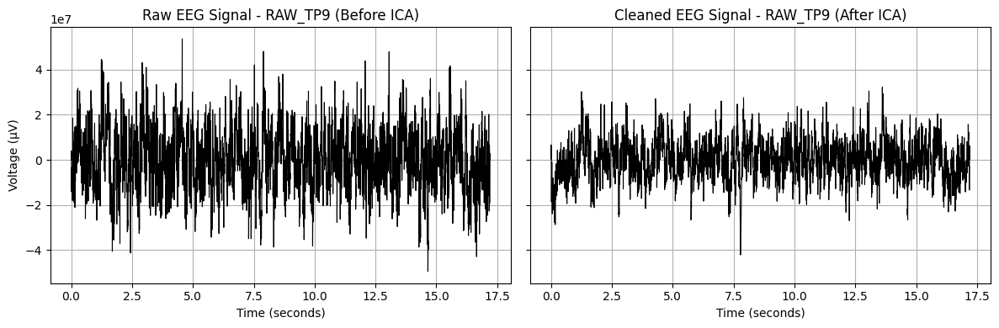


📊 Comparing raw vs cleaned EEG signal for dataset 2...


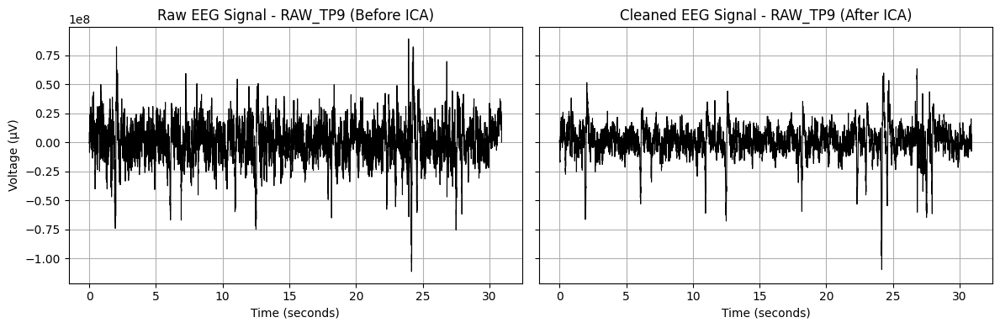


📊 Comparing raw vs cleaned EEG signal for dataset 3...


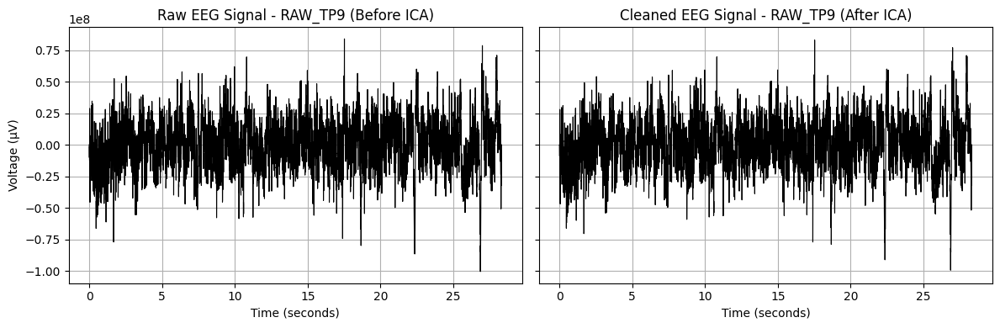


📊 Comparing raw vs cleaned EEG signal for dataset 4...


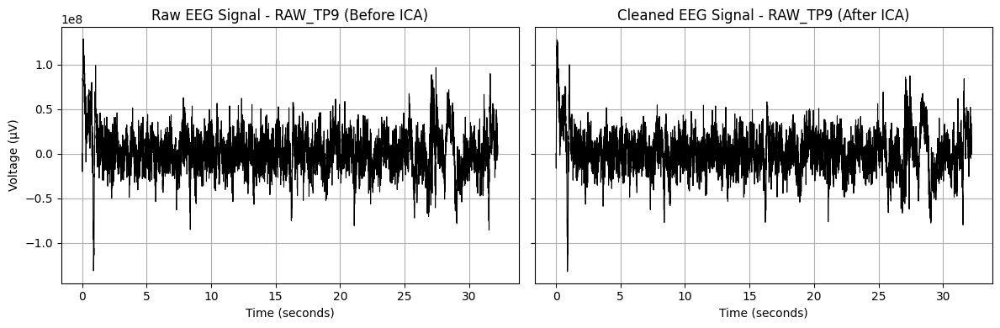

✅ Raw vs. Cleaned EEG side-by-side comparison completed for all datasets!


In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Define the EEG channel to visualize
channel_to_plot = "RAW_TP9"  # Change this to any RAW_ channel in your dataset

# Loop through all datasets and compare raw vs cleaned EEG signals
for i, (raw, raw_cleaned) in enumerate(zip(raw_datasets, processed_datasets)):
    print(f"\n📊 Comparing raw vs cleaned EEG signal for dataset {i+1}...")

    # Check if the selected channel exists in the dataset
    if channel_to_plot not in raw.ch_names:
        print(f"⚠ Channel {channel_to_plot} not found in dataset {i+1}. Skipping...")
        continue

    # Get data and times for the chosen channel
    raw_data, times = raw.get_data(picks=channel_to_plot, return_times=True)
    cleaned_data, _ = raw_cleaned.get_data(picks=channel_to_plot, return_times=True)

    # Convert to microvolts (optional, based on EEG system)
    raw_data = raw_data * 1e6  # Convert to µV
    cleaned_data = cleaned_data * 1e6  # Convert to µV

    # Create a side-by-side plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

    # Plot Raw EEG Signal
    axes[0].plot(times, raw_data.T, color="black", linewidth=0.8)
    axes[0].set_title(f"Raw EEG Signal - {channel_to_plot} (Before ICA)")
    axes[0].set_xlabel("Time (seconds)")
    axes[0].set_ylabel("Voltage (µV)")
    axes[0].grid(True)

    # Plot Cleaned EEG Signal
    axes[1].plot(times, cleaned_data.T, color="black", linewidth=0.8)
    axes[1].set_title(f"Cleaned EEG Signal - {channel_to_plot} (After ICA)")
    axes[1].set_xlabel("Time (seconds)")
    axes[1].grid(True)

    # Show the figure
    plt.tight_layout()
    plt.show()

print("✅ Raw vs. Cleaned EEG side-by-side comparison completed for all datasets!")



🧠 Generating Alpha/Beta Ratio Topomap for Dataset 1...
Effective window size : 4.000 (s)


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


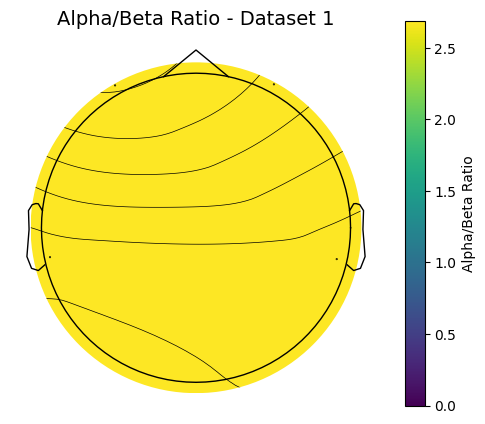


🧠 Generating Alpha/Beta Ratio Topomap for Dataset 2...
Effective window size : 4.000 (s)


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


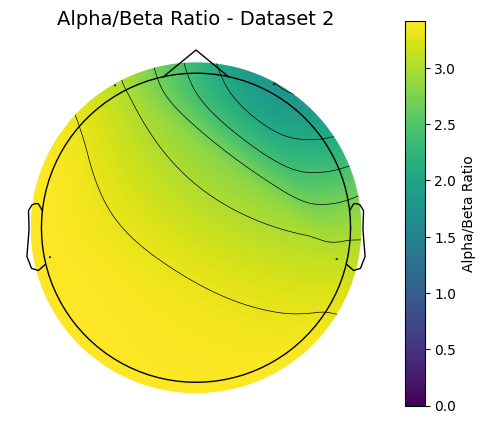


🧠 Generating Alpha/Beta Ratio Topomap for Dataset 3...
Effective window size : 4.000 (s)


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


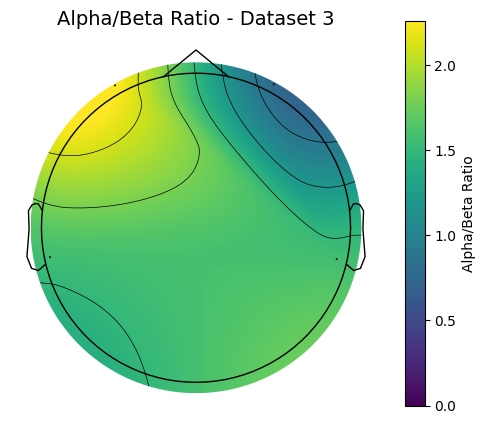


🧠 Generating Alpha/Beta Ratio Topomap for Dataset 4...
Effective window size : 4.000 (s)


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


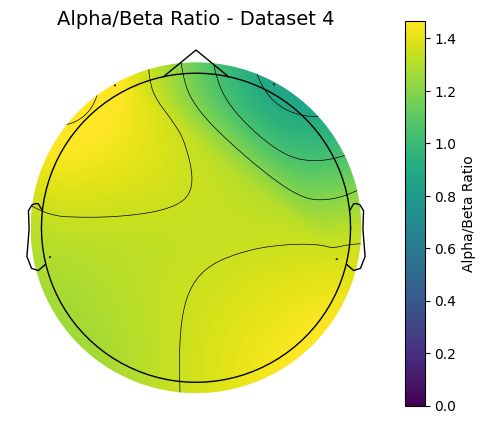

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import mne
from mne.time_frequency import psd_array_welch

for i, raw in enumerate(processed_datasets):
    print(f"\n🧠 Generating Alpha/Beta Ratio Topomap for Dataset {i+1}...")

    # 1) Copy raw for visualization/analysis (so original stays untouched)
    raw_vis = raw.copy()

    # 2) (Optional) Rename channels if needed
    #    Adjust keys to match the *exact* names in raw_vis.info["ch_names"]
    mapping = {
        "RAW_AF7": "AF7",
        "RAW_AF8": "AF8",
        "RAW_TP9": "TP9",
        "RAW_TP10": "TP10"
    }
    # Rename only if these channel names actually exist
    raw_vis.rename_channels(mapping, allow_duplicates=True)

    # 3) Set the standard 10-20 montage
    raw_vis.set_montage("standard_1020", on_missing='ignore')

    # 4) Pick EEG channels (exclude EOG, ECG, etc.)
    picks = mne.pick_types(raw_vis.info, eeg=True, exclude='bads')

    # 5) Extract the data array (shape: [n_channels, n_times])
    data = raw_vis.get_data(picks=picks)
    sfreq = raw_vis.info['sfreq']

    # 6) Compute PSD with Welch's method on the NumPy array
    #    psd_array_welch returns psds shape (n_channels, n_freqs)
    psds, freqs = psd_array_welch(
        data,
        sfreq=sfreq,
        fmin=0.5,
        fmax=40.0,
        n_fft=1024
    )

    # 7) Average power in alpha band (8–13 Hz) and beta band (13–30 Hz)
    alpha_idx = (freqs >= 8) & (freqs <= 13)
    beta_idx  = (freqs >= 13) & (freqs <= 30)

    alpha_power = psds[:, alpha_idx].mean(axis=1)  # shape: (n_channels,)
    beta_power  = psds[:, beta_idx].mean(axis=1)   # shape: (n_channels,)

    # 8) Compute alpha/beta ratio
    ratio = alpha_power / (beta_power + 1e-12)

    # 9) Plot topomap of the ratio
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        ratio,
        raw_vis.info,  # info has channel locations
        axes=ax,
        cmap='viridis',
        sensors=True,
        outlines='head',
        show=False
    )

    # 10) Add colorbar & title
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Alpha/Beta Ratio", rotation=90)
    ax.set_title(f"Alpha/Beta Ratio - Dataset {i+1}", fontsize=14)

    # 11) Show the figure
    plt.show()



In [7]:
def bandpower(data, sf, band, method='welch', window_sec=None, relative=False):

    from scipy.signal import welch
    from scipy.integrate import simpson
    from mne.time_frequency import psd_array_multitaper

    band = np.asarray(band)
    low, high = band

    # Compute the modified periodogram (Welch)
    if method == 'welch':
        if window_sec is not None:
            nperseg = window_sec * sf
        else:
            nperseg = (2 / low) * sf

        freqs, psd = welch(data, sf, nperseg=nperseg)

    elif method == 'multitaper':
        psd, freqs = psd_array_multitaper(data, sf, adaptive=True,
                                          normalization='full', verbose=0)

    # Frequency resolution
    freq_res = freqs[1] - freqs[0]

    # Find index of band in frequency vector
    idx_band = np.logical_and(freqs >= low, freqs <= high)

    bp = simpson(psd[idx_band], dx=freq_res)

    if relative:
        bp /= simpson(psd, dx=freq_res)
    return bp

In [8]:
import numpy as np
from scipy.signal import welch, periodogram
from scipy.integrate import simpson
from mne.time_frequency import psd_array_multitaper

def bandpower(data, sf, band, method='welch', relative=False):
    """
    Compute EEG power in a given frequency band using Welch, Multitaper, or Periodogram.

    Parameters:
    - data: 1D numpy array, EEG signal.
    - sf: int, Sampling frequency (Hz).
    - band: list or tuple, Frequency band (e.g., [0.5, 4] for Delta).
    - method: str, Spectral estimation method ('welch', 'multitaper', 'periodogram').
    - relative: bool, If True, returns relative power.

    Returns:
    - bp: float, Absolute or relative band power.
    """

    low, high = band  # Get frequency range

    # Compute Power Spectral Density (PSD) using the selected method
    if method == 'welch':
        freqs, psd = welch(data, sf, nperseg=int(2 / low * sf))
    elif method == 'multitaper':
        psd, freqs = psd_array_multitaper(data, sf, adaptive=True, normalization='full', verbose=0)
    elif method == 'periodogram':
        freqs, psd = periodogram(data, sf)
    else:
        raise ValueError("Invalid method. Choose 'welch', 'multitaper', or 'periodogram'.")

    # Get power in the selected frequency band
    idx_band = np.logical_and(freqs >= low, freqs <= high)
    bp = simpson(psd[idx_band], dx=freqs[1] - freqs[0])

    # Compute relative power if required
    return bp / simpson(psd, dx=freqs[1] - freqs[0]) if relative else bp



📊 Processing PSD for Dataset 1...
✅ Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


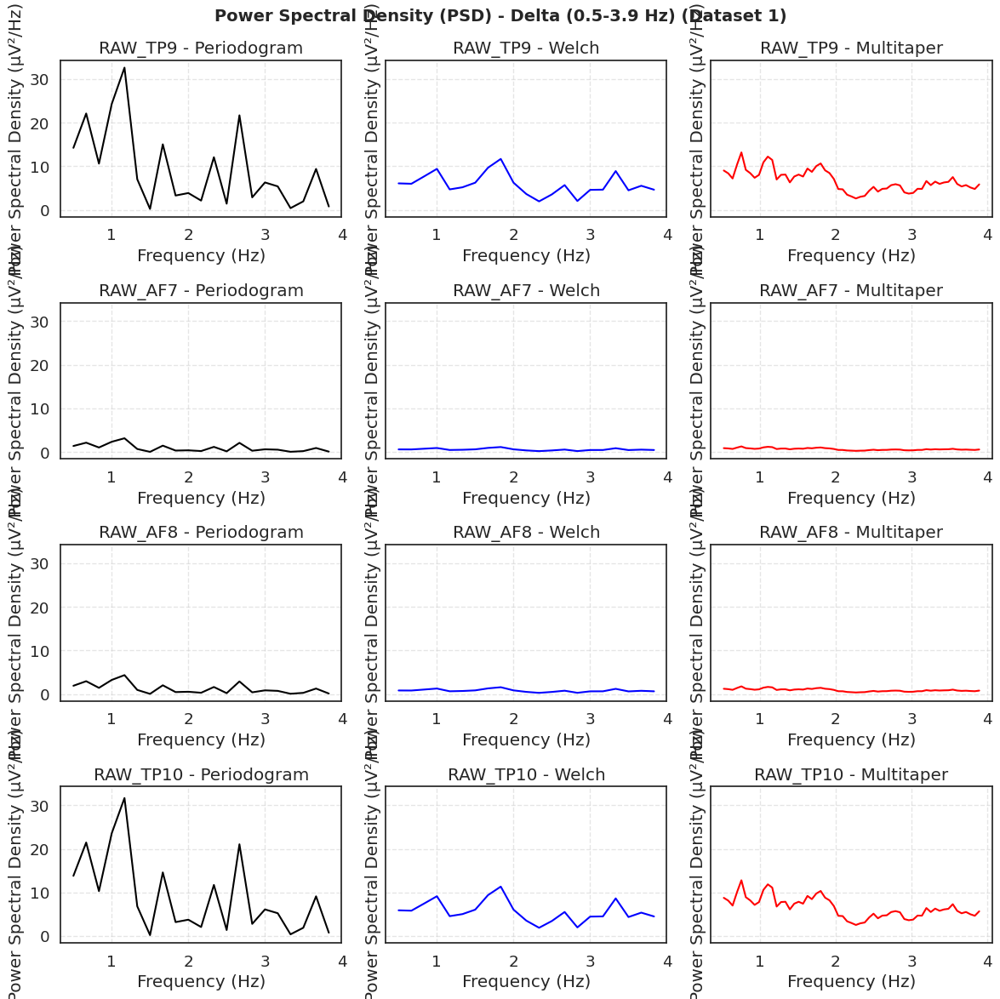

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


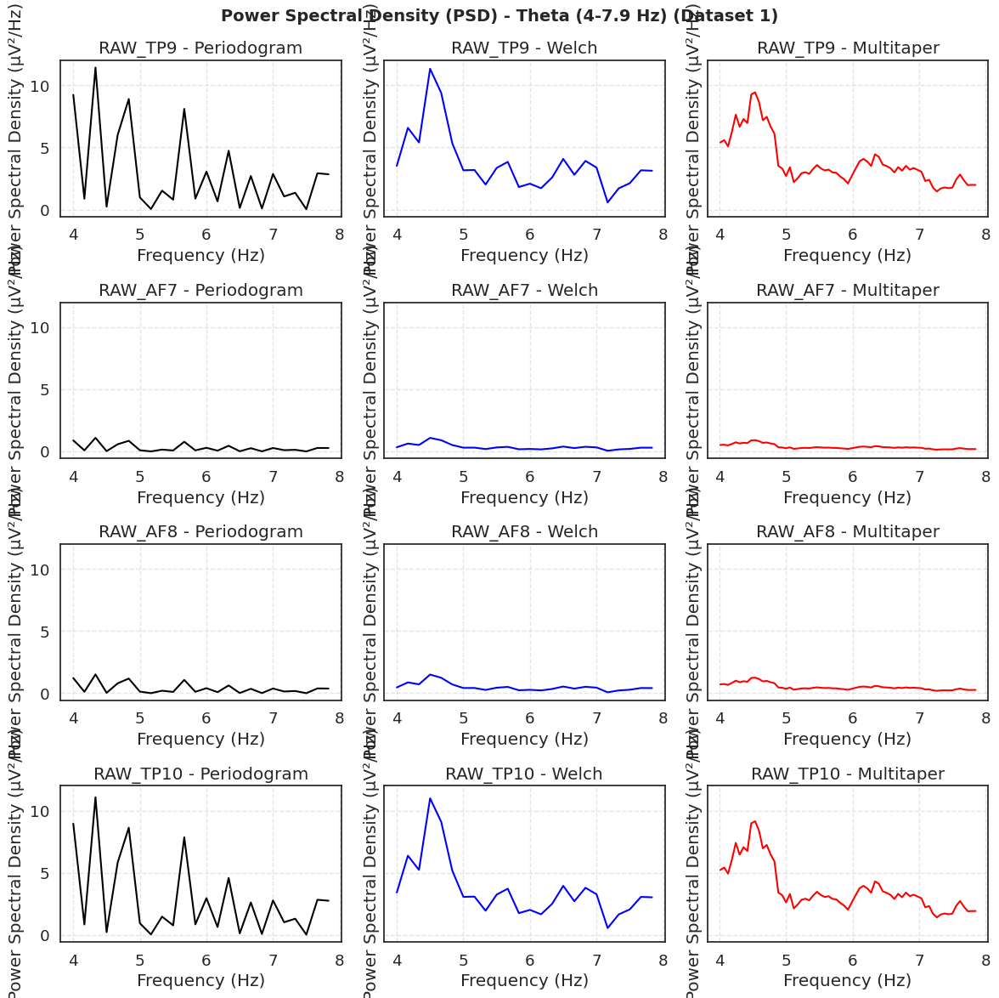

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


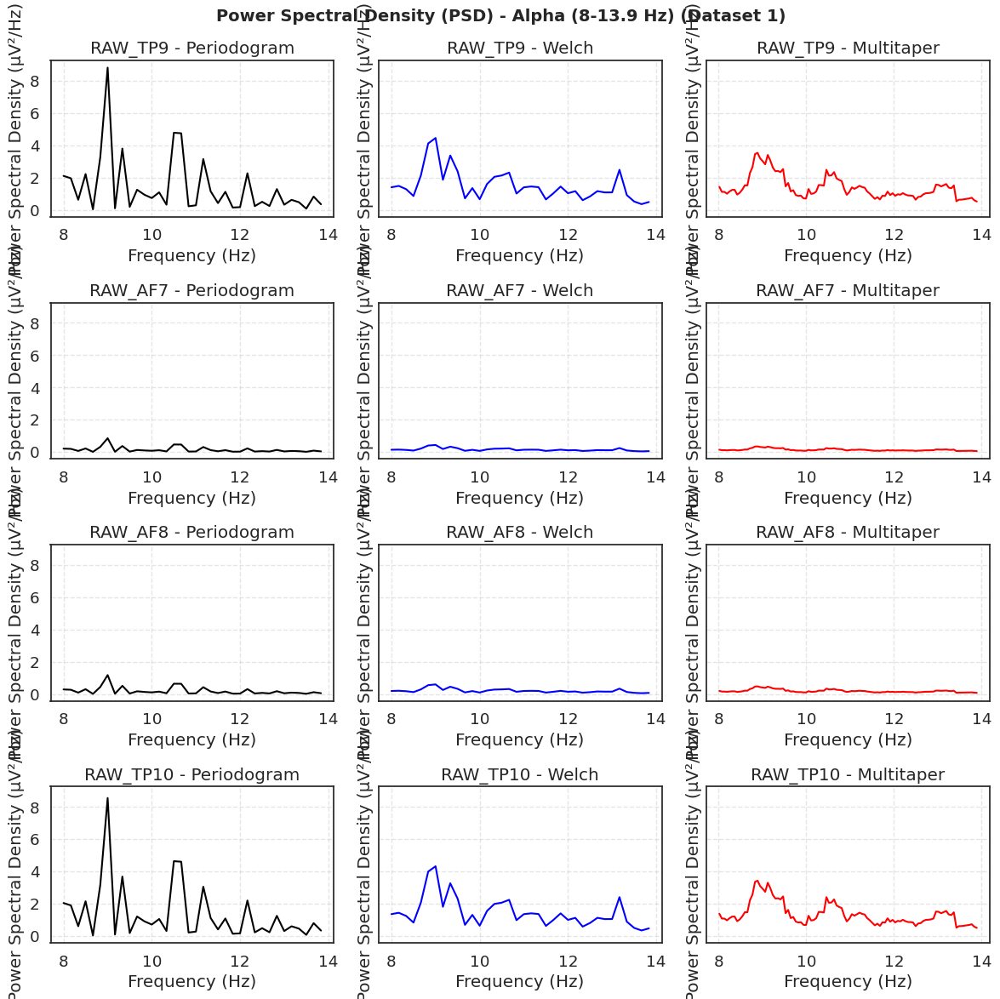

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


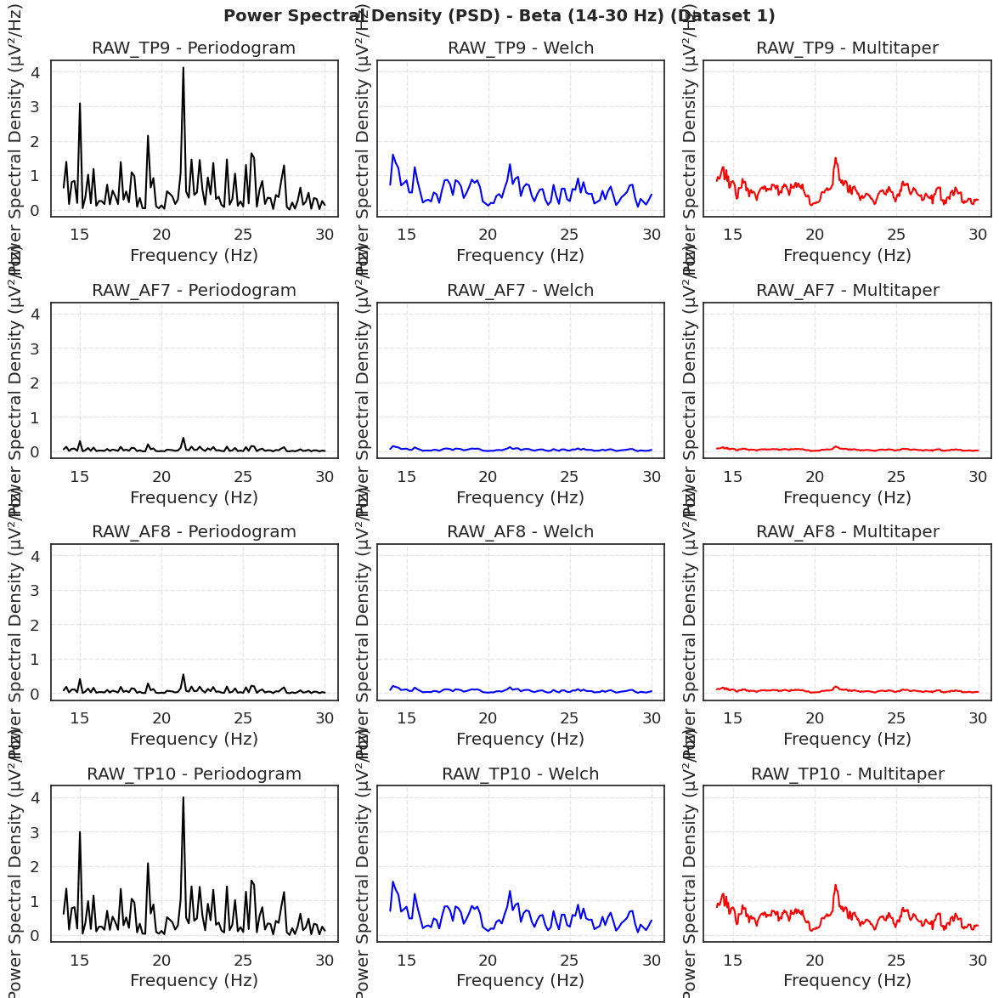

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


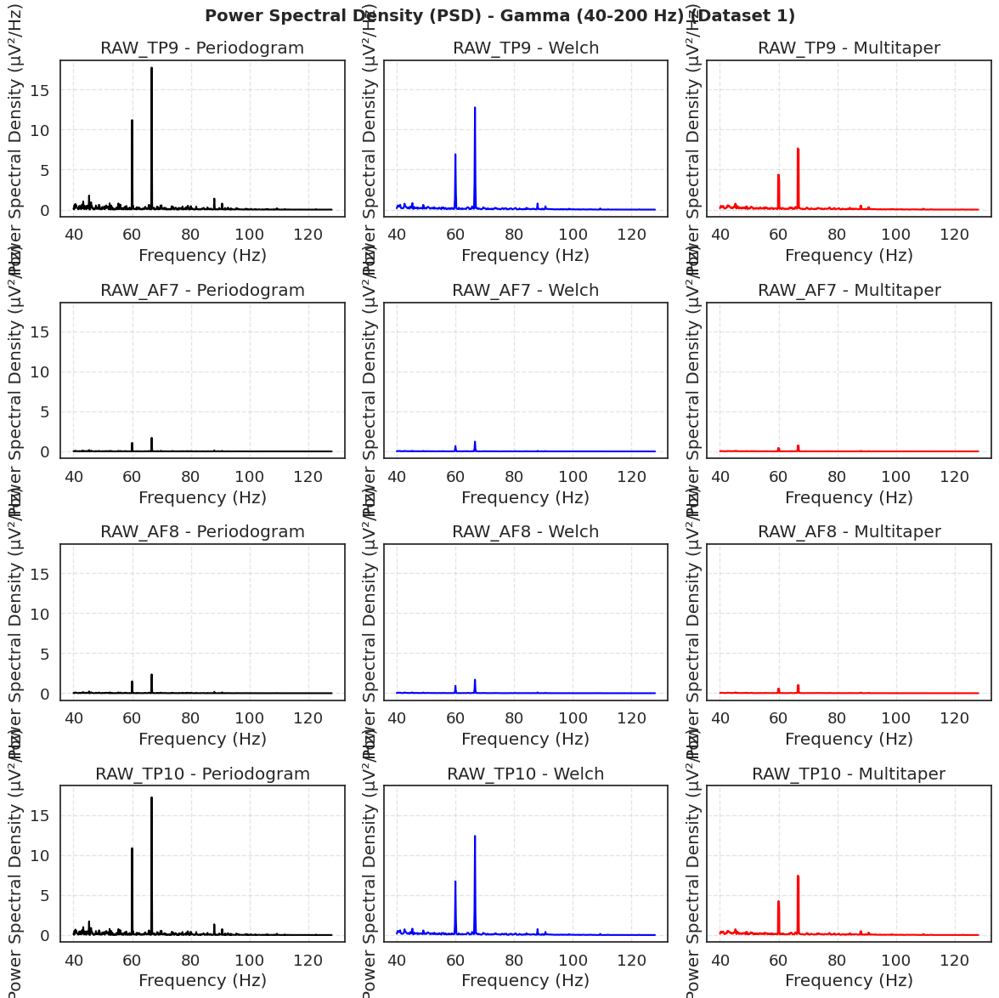


📊 Processing PSD for Dataset 2...
✅ Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


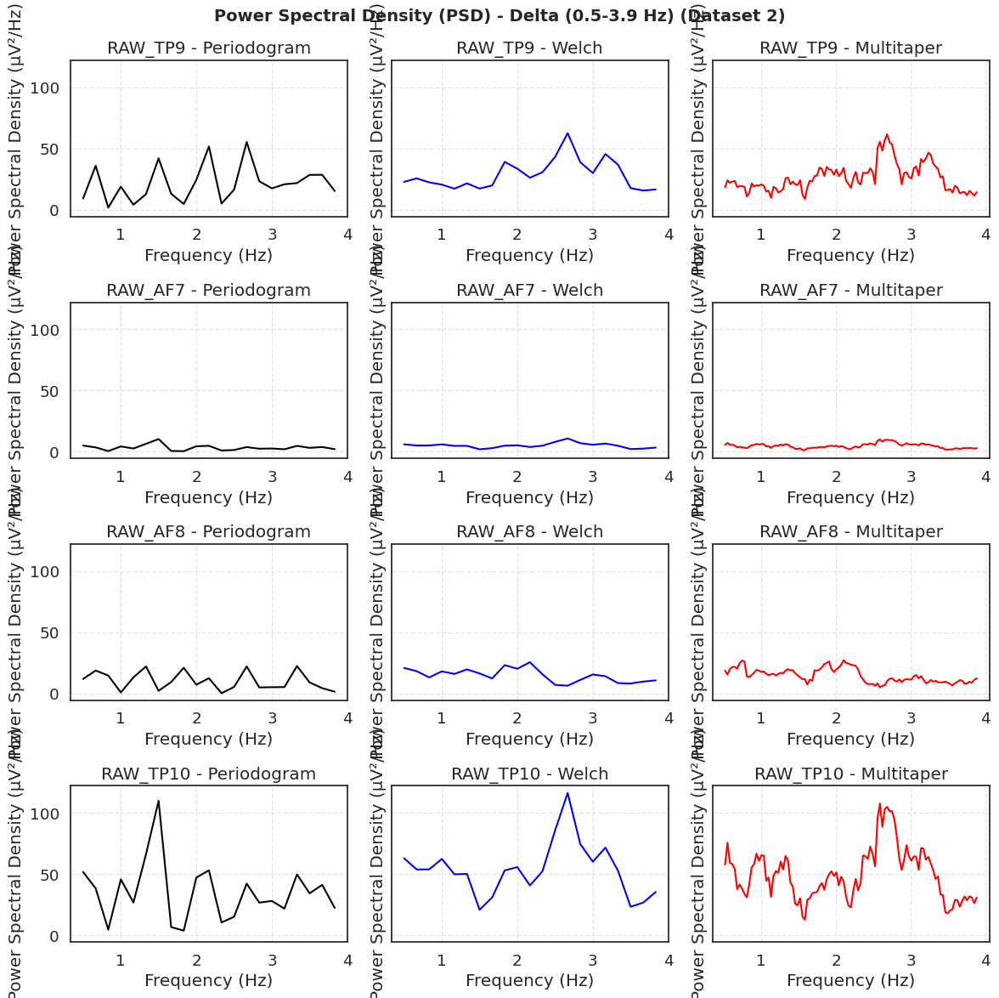

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


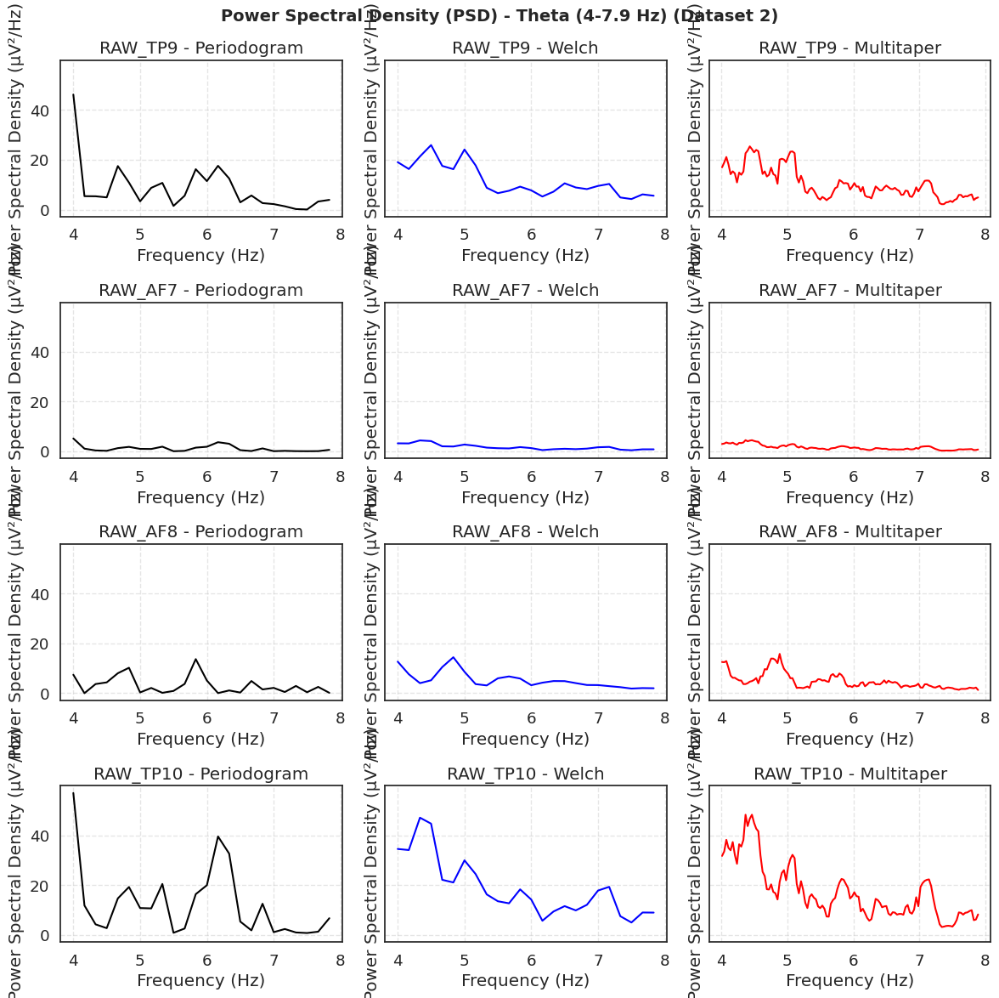

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


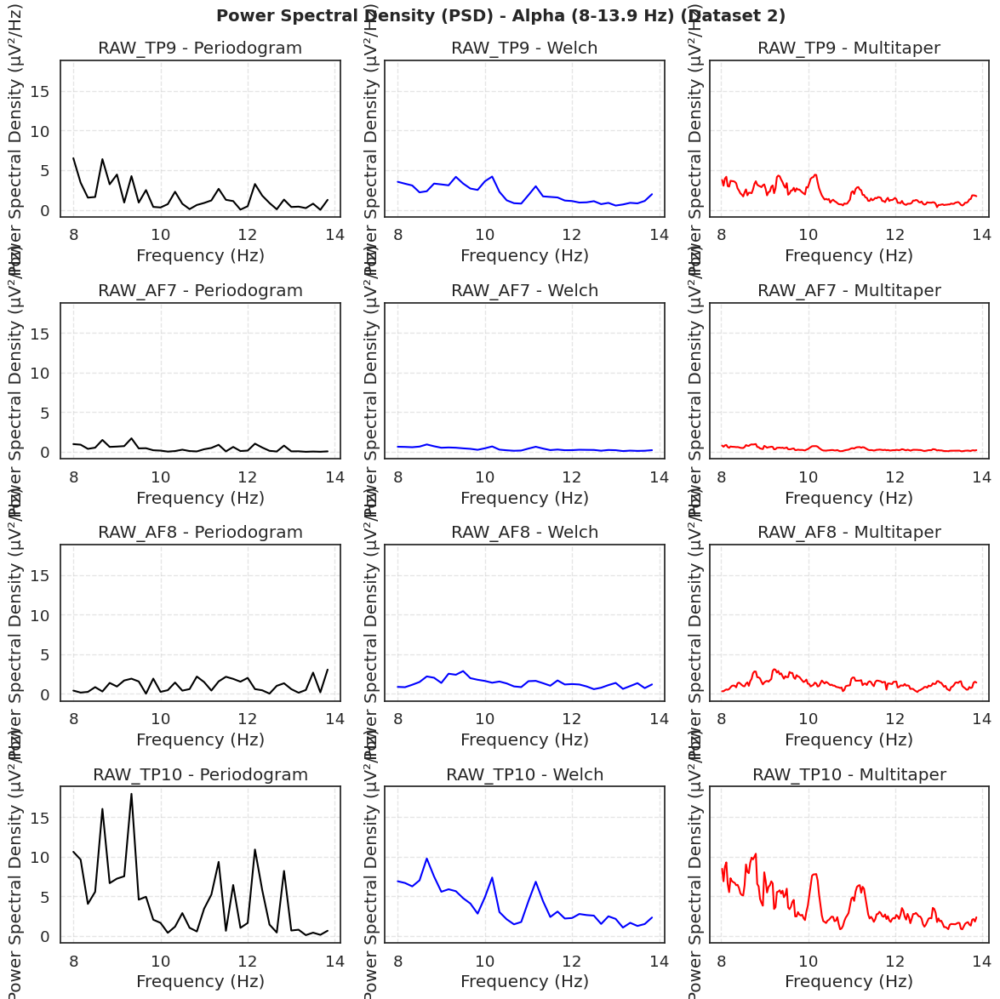

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


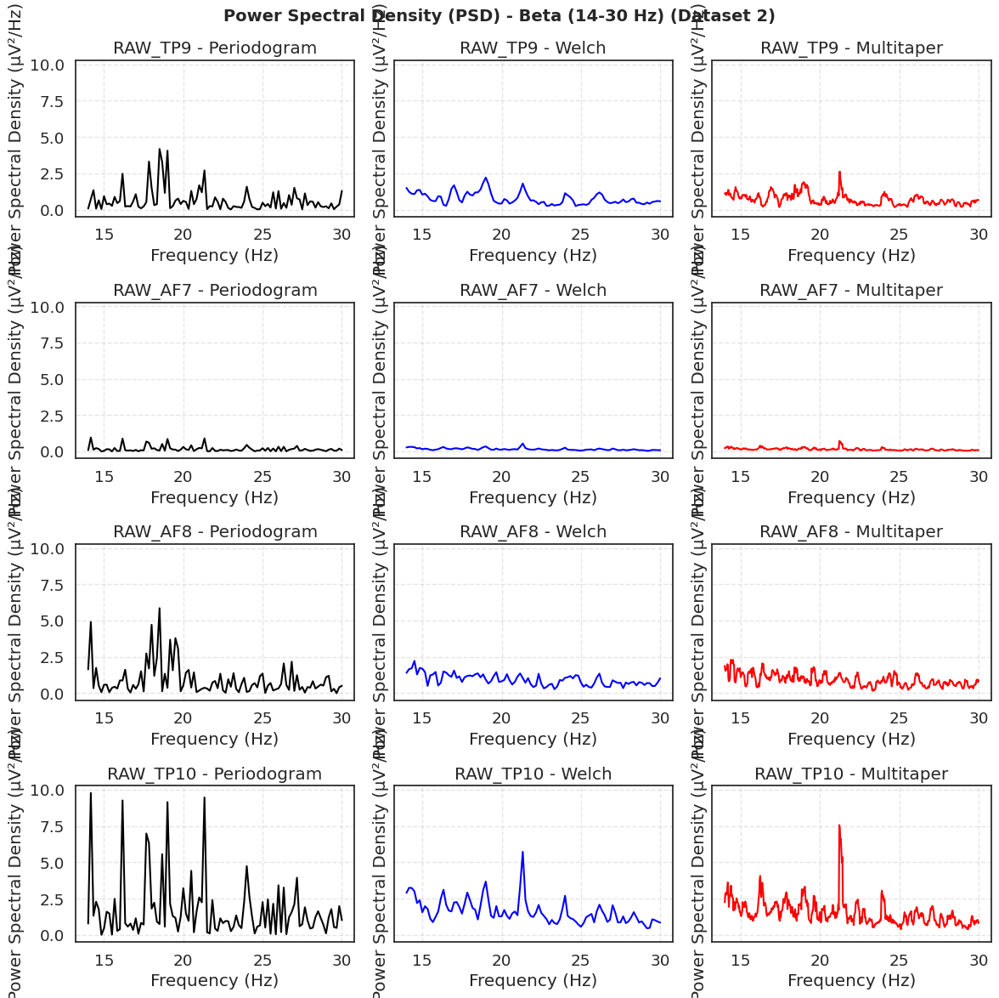

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


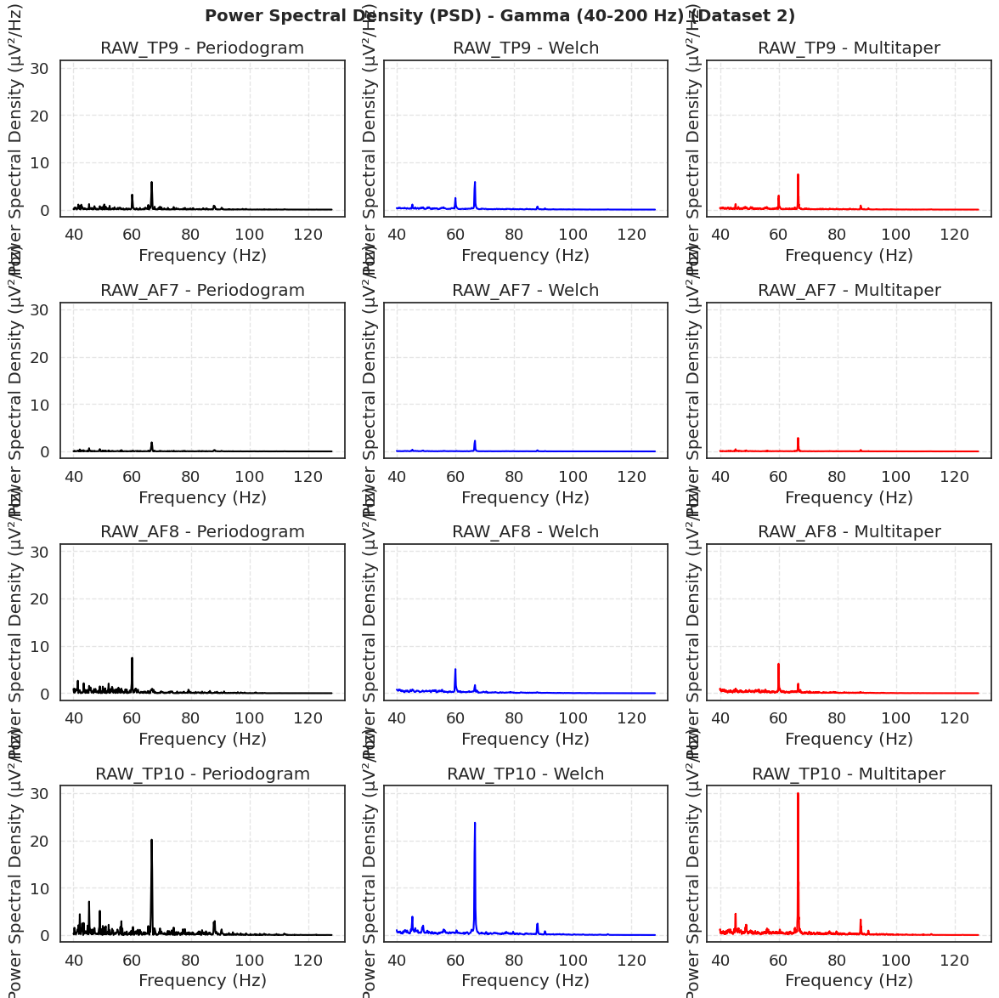


📊 Processing PSD for Dataset 3...
✅ Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


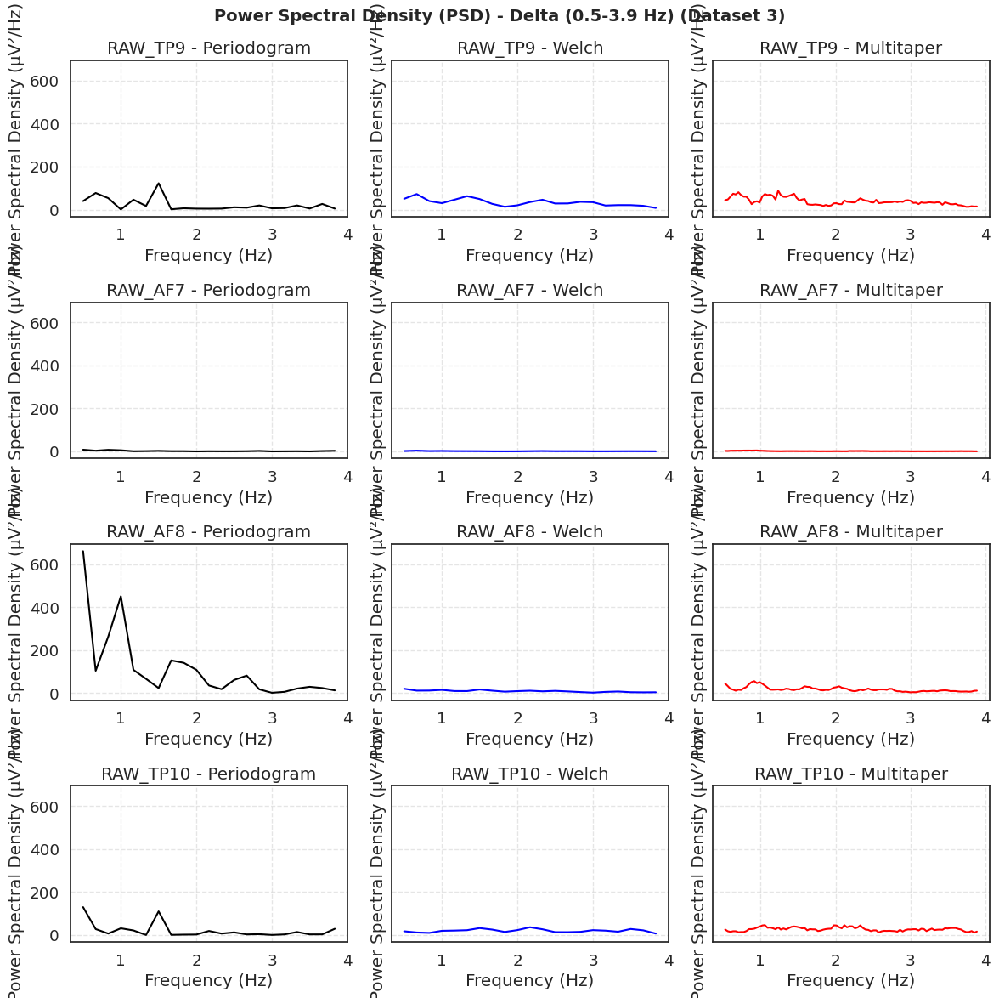

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


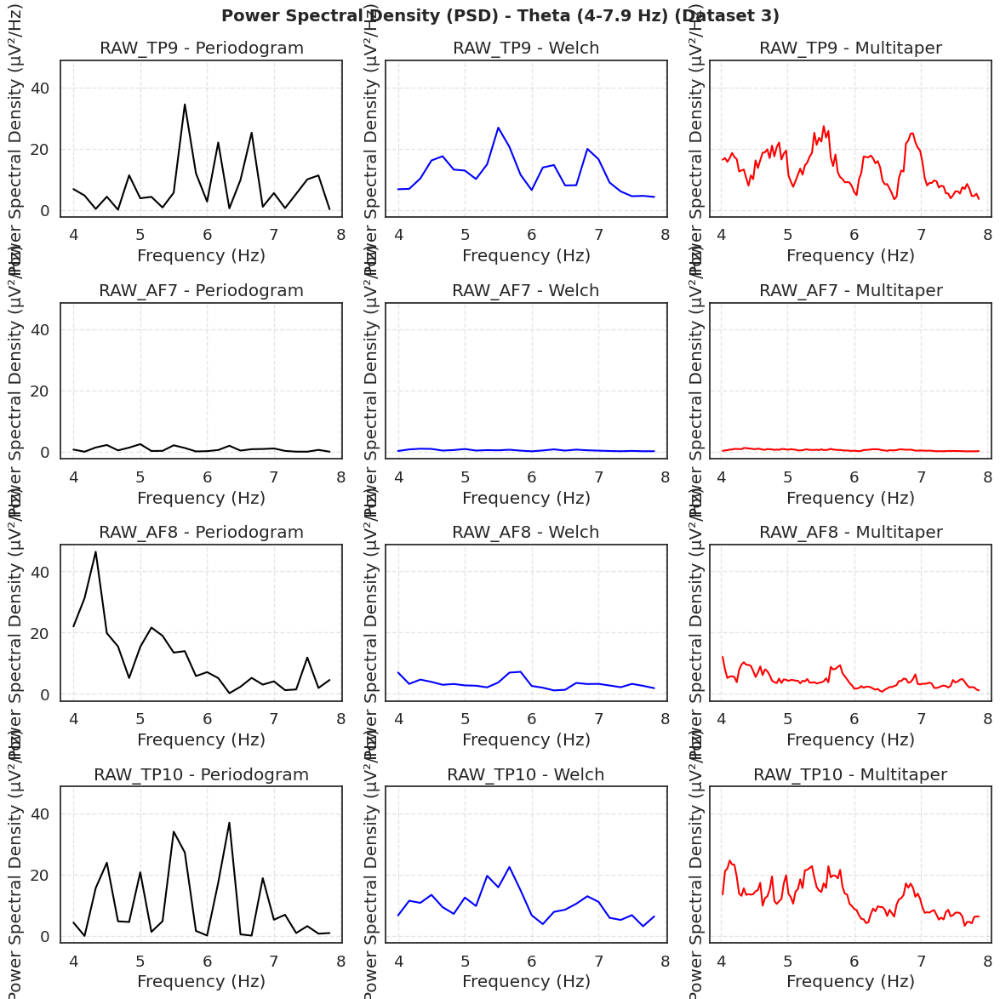

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


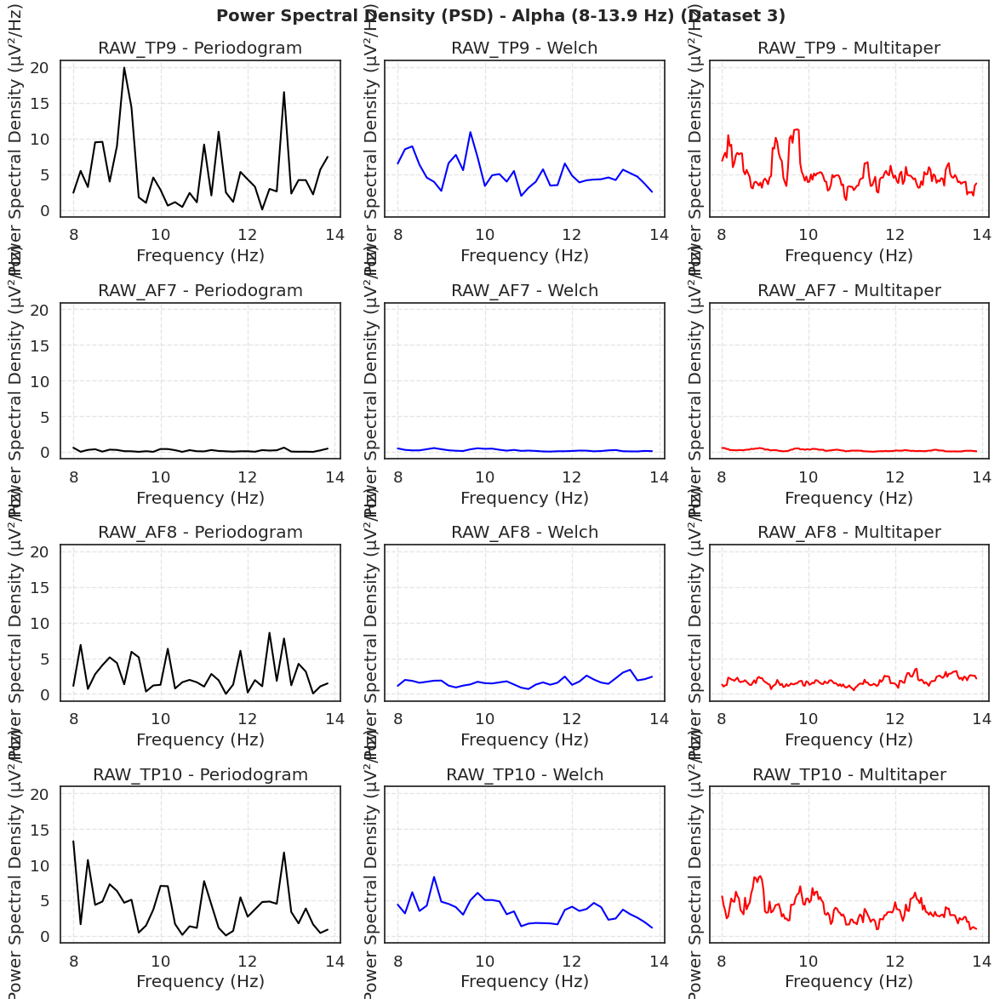

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


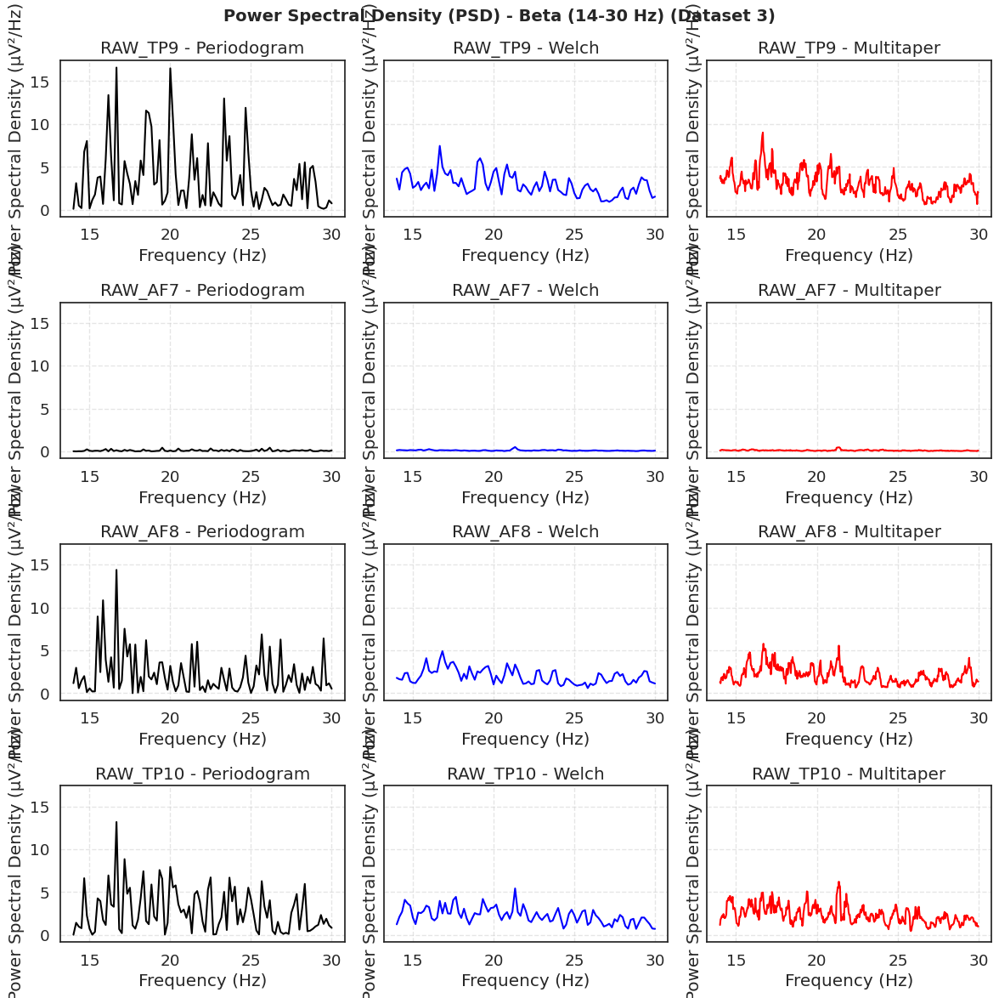

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


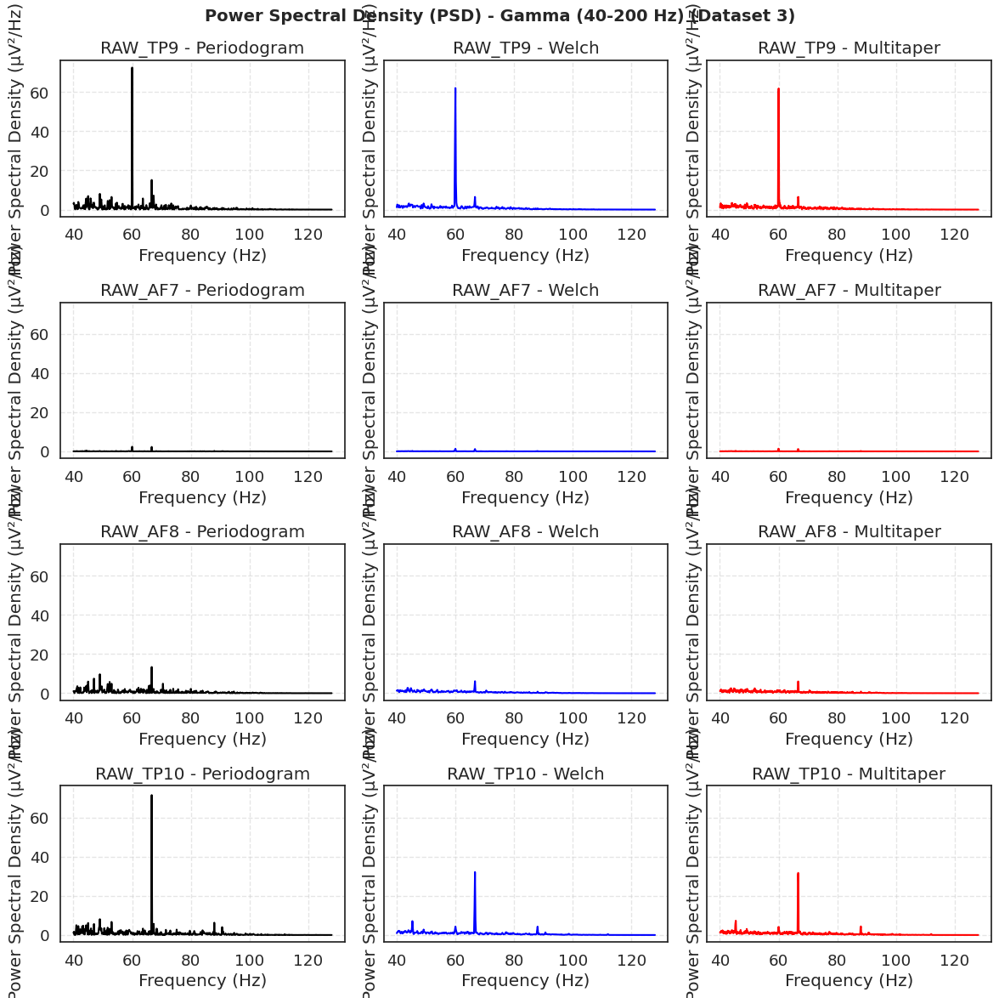


📊 Processing PSD for Dataset 4...
✅ Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


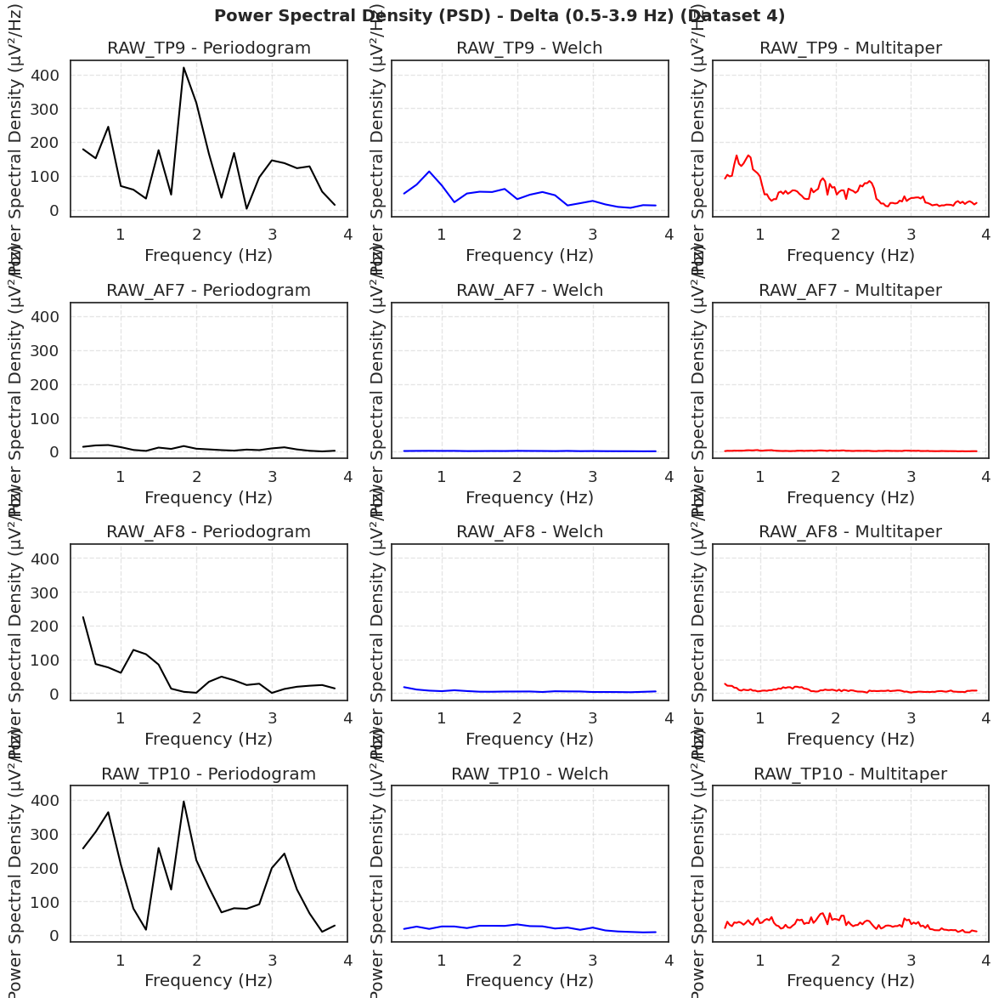

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


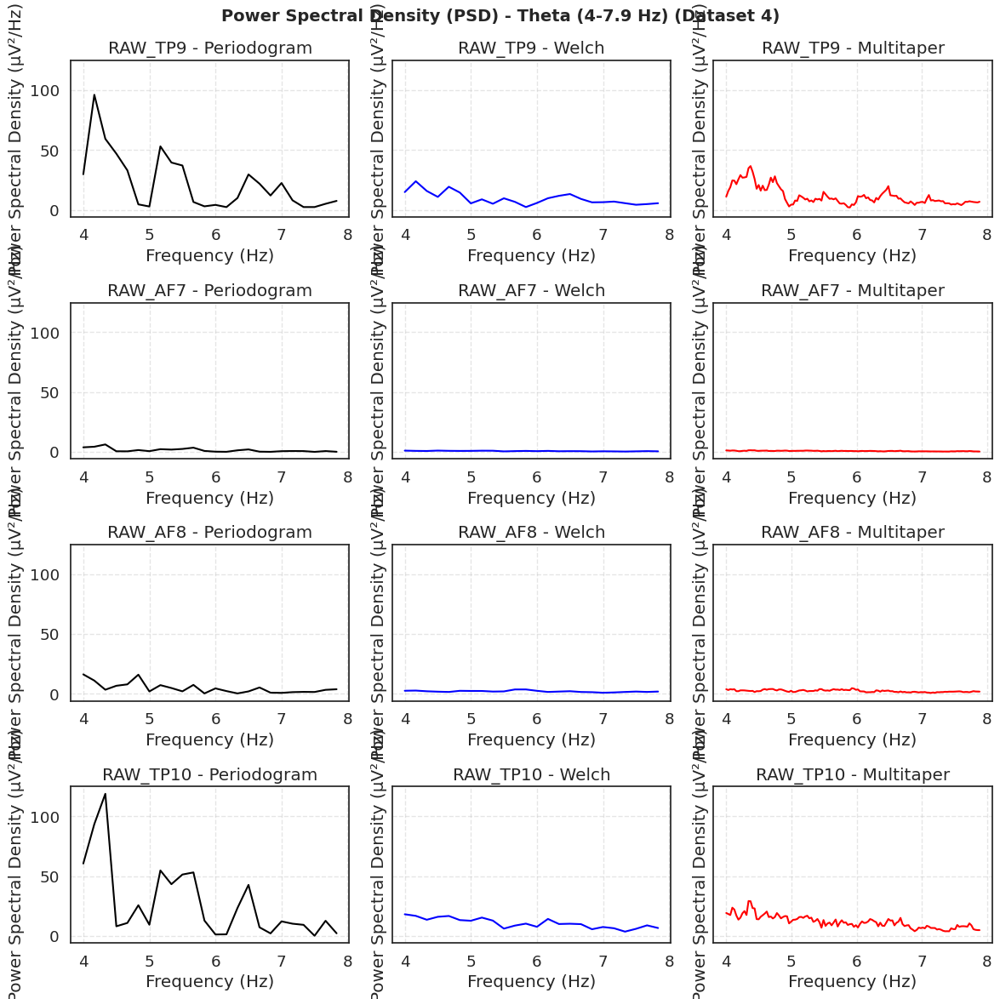

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


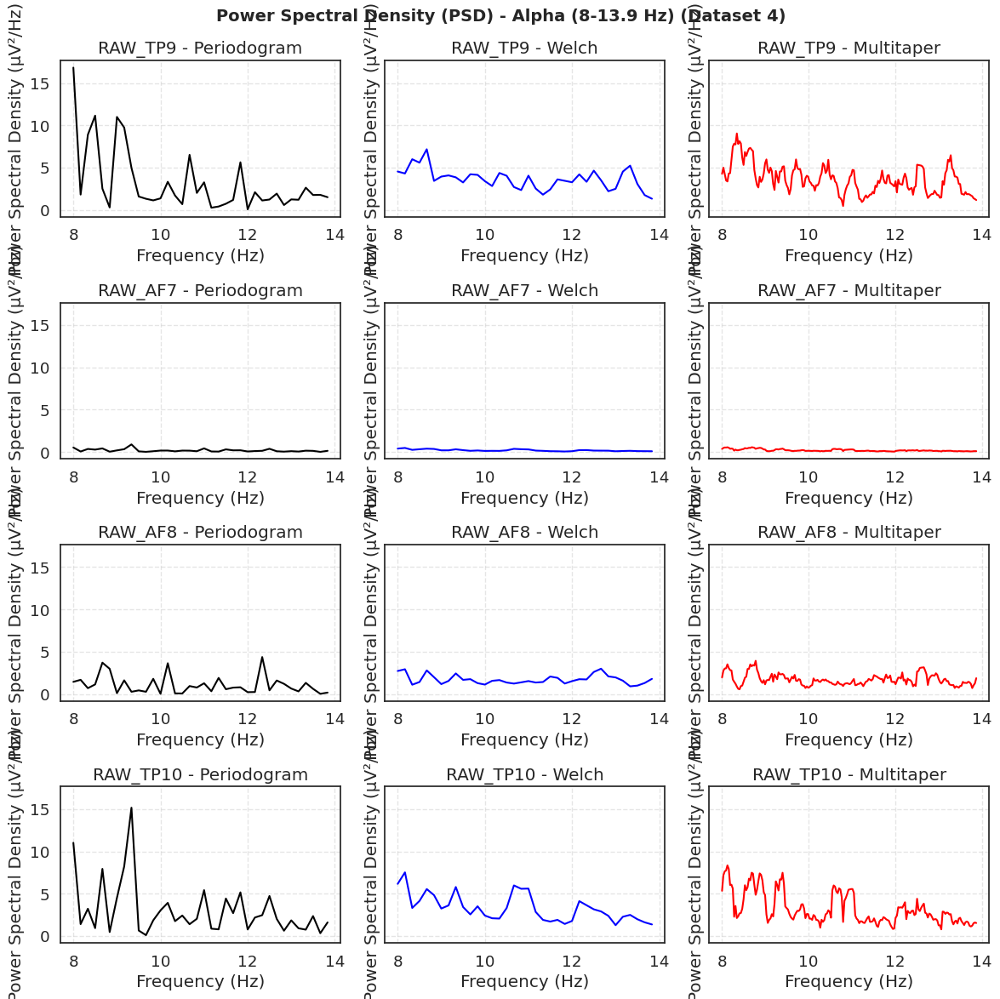

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


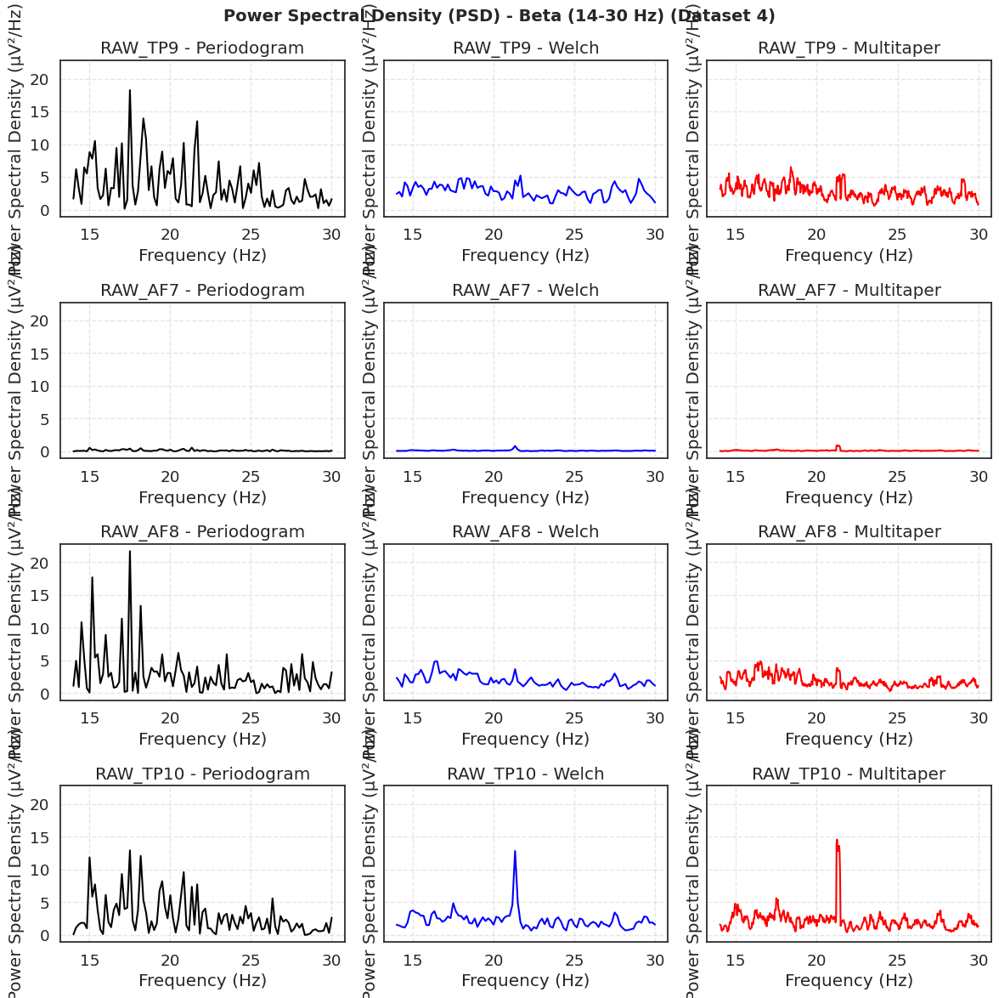

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


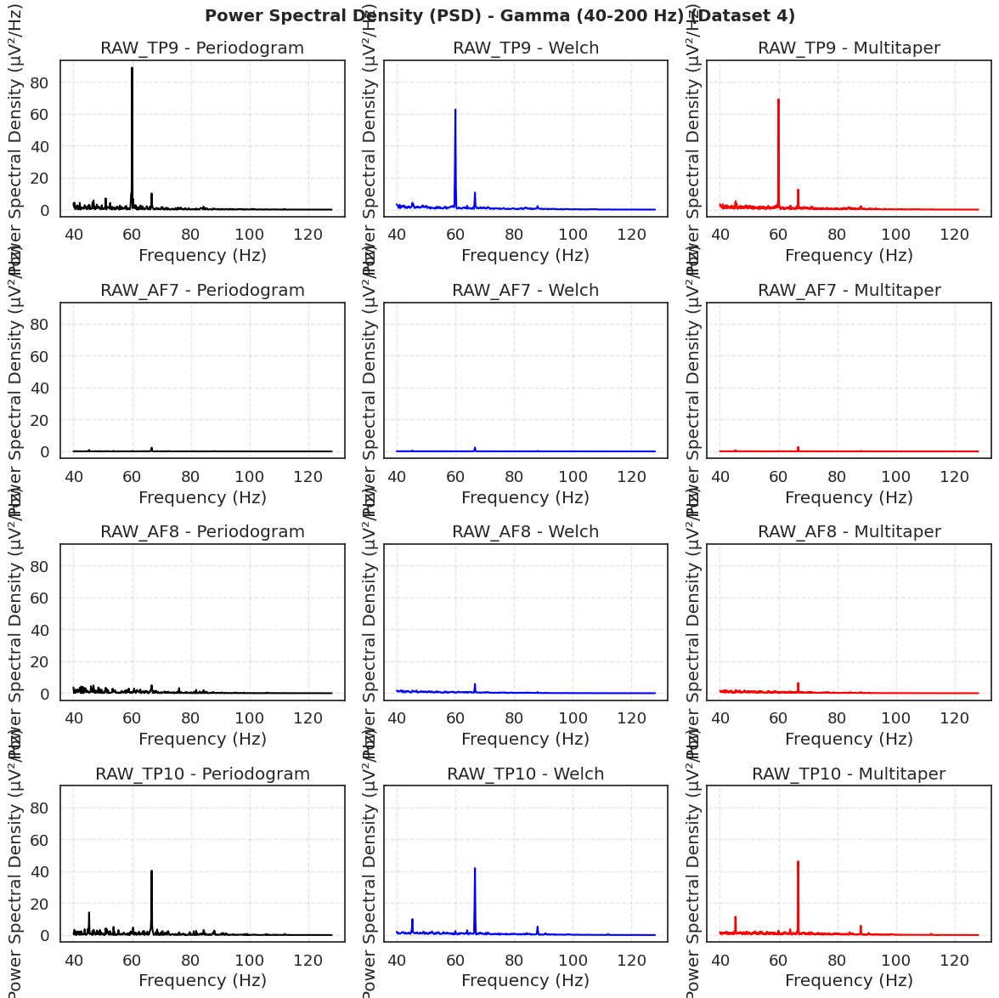

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import welch, periodogram
from mne.time_frequency import psd_array_multitaper

# Define EEG frequency bands
FREQ_BANDS = {
    "Delta (0.5-3.9 Hz)": (0.5, 3.9),
    "Theta (4-7.9 Hz)": (4, 7.9),
    "Alpha (8-13.9 Hz)": (8, 13.9),
    "Beta (14-30 Hz)": (14, 30),
    "Gamma (40-200 Hz)": (40, 200)
}

# Function to compute and plot PSD for all datasets, channels, and frequency bands
def plot_spectrum_all_datasets(processed_datasets, window_sec=6, dB=False):
    sns.set(style="white", font_scale=1.2)

    for dataset_idx, raw_cleaned in enumerate(processed_datasets):
        print(f"\n📊 Processing PSD for Dataset {dataset_idx+1}...")

        # Ensure valid dataset
        if raw_cleaned is None or not hasattr(raw_cleaned, "ch_names"):
            print(f"⚠ Skipping dataset {dataset_idx+1} (Invalid or empty dataset)")
            continue

        # Automatically detect the sampling frequency from the dataset
        sfreq = raw_cleaned.info['sfreq']
        print(f"✅ Detected Sampling Frequency: {sfreq} Hz")

        channels = raw_cleaned.ch_names  # Get all EEG channels

        for band_name, band in FREQ_BANDS.items():
            fig, axes = plt.subplots(len(channels), 3, figsize=(12, 3 * len(channels)), sharey=True)
            fig.suptitle(f"Power Spectral Density (PSD) - {band_name} (Dataset {dataset_idx+1})",
                         fontsize=14, fontweight="bold")

            for i, channel in enumerate(channels):
                # Get channel index and extract EEG data
                ch_index = raw_cleaned.ch_names.index(channel)
                data = raw_cleaned.get_data(picks=ch_index).flatten()

                # Compute window size based on detected sampling frequency
                window_size = int(window_sec * sfreq)

                # Compute PSD using different methods
                freqs_per, psd_per = periodogram(data, sfreq, nfft=window_size)
                freqs_welch, psd_welch = welch(data, sfreq, nperseg=window_size)
                psd_mt, freqs_mt = psd_array_multitaper(data, sfreq, adaptive=True,
                                                        normalization="full", verbose=0)

                # Convert to dB if requested
                if dB:
                    psd_per = 10 * np.log10(psd_per + 1e-10)  # Avoid log(0) errors
                    psd_welch = 10 * np.log10(psd_welch + 1e-10)
                    psd_mt = 10 * np.log10(psd_mt + 1e-10)

                # Filter for selected frequency band
                fmin, fmax = band
                mask_per = (freqs_per >= fmin) & (freqs_per <= fmax)
                mask_welch = (freqs_welch >= fmin) & (freqs_welch <= fmax)
                mask_mt = (freqs_mt >= fmin) & (freqs_mt <= fmax)

                # Apply mask to select only desired frequencies
                freqs_per, psd_per = freqs_per[mask_per], psd_per[mask_per]
                freqs_welch, psd_welch = freqs_welch[mask_welch], psd_welch[mask_welch]
                freqs_mt, psd_mt = freqs_mt[mask_mt], psd_mt[mask_mt]

                # Plot PSD for the selected frequency band
                axes[i, 0].plot(freqs_per, psd_per, color="black")
                axes[i, 0].set_title(f"{channel} - Periodogram")

                axes[i, 1].plot(freqs_welch, psd_welch, color="blue")
                axes[i, 1].set_title(f"{channel} - Welch")

                axes[i, 2].plot(freqs_mt, psd_mt, color="red")
                axes[i, 2].set_title(f"{channel} - Multitaper")

                # Set axis labels
                for ax in axes[i]:
                    ax.set_xlabel("Frequency (Hz)")
                    ax.set_ylabel("Power Spectral Density (µV²/Hz)" if not dB else "Decibels (dB/Hz)")
                    ax.grid(True, linestyle="--", alpha=0.5)

            plt.tight_layout()
            plt.show()

# Run the function for all datasets
plot_spectrum_all_datasets(processed_datasets, window_sec=6, dB=False)


In [10]:
import numpy as np
import pandas as pd
from scipy.signal import periodogram, welch
from mne.time_frequency import psd_array_multitaper

# Define EEG frequency bands (excluding Epsilon)
FREQ_BANDS = {
    "Delta (0.5-3.9 Hz)": (0.5, 3.9),
    "Theta (4-7.9 Hz)": (4, 7.9),
    "Alpha (8-13.9 Hz)": (8, 13.9),
    "Beta (14-30 Hz)": (14, 30),
    "Gamma (40-200 Hz)": (40, 200)
}

# Function to compute absolute and relative power for all datasets, channels, and frequency bands
def compute_power_all_datasets(processed_datasets):
    all_results = []  # Store power data for all datasets

    for dataset_idx, raw_cleaned in enumerate(processed_datasets):
        print(f"\nProcessing power for Dataset {dataset_idx+1}...")

        # Ensure dataset is valid
        if raw_cleaned is None or not hasattr(raw_cleaned, "ch_names"):
            print(f"Skipping dataset {dataset_idx+1} (Invalid or empty dataset)")
            continue

        # Detect sampling frequency from the dataset
        sfreq = raw_cleaned.info['sfreq']
        print(f"Detected Sampling Frequency: {sfreq} Hz")

        channels = raw_cleaned.ch_names  # Get all EEG channels

        for channel in channels:
            # Get channel index and extract EEG data
            ch_index = raw_cleaned.ch_names.index(channel)
            data = raw_cleaned.get_data(picks=ch_index).flatten()

            # Compute PSD using different methods
            freqs_per, psd_per = periodogram(data, sfreq)
            freqs_welch, psd_welch = welch(data, sfreq, nperseg=min(len(data), 4 * int(sfreq)))
            psd_mt, freqs_mt = psd_array_multitaper(data, sfreq=sfreq, adaptive=True, normalization='full', verbose=0)

            # Function to compute power within a frequency band
            def power_in_band(freqs, psd, band):
                band_mask = (freqs >= band[0]) & (freqs <= band[1])
                return np.sum(psd[band_mask]) if np.any(band_mask) else 0

            # Compute power for each frequency band
            for band_name, band in FREQ_BANDS.items():
                abs_power_per = power_in_band(freqs_per, psd_per, band)
                abs_power_welch = power_in_band(freqs_welch, psd_welch, band)
                abs_power_mt = power_in_band(freqs_mt, psd_mt, band)

                total_power_per = np.sum(psd_per) if np.sum(psd_per) != 0 else 1
                total_power_welch = np.sum(psd_welch) if np.sum(psd_welch) != 0 else 1
                total_power_mt = np.sum(psd_mt) if np.sum(psd_mt) != 0 else 1

                # Compute relative power
                rel_power_per = abs_power_per / total_power_per
                rel_power_welch = abs_power_welch / total_power_welch
                rel_power_mt = abs_power_mt / total_power_mt

                # Store results for each dataset
                all_results.append({
                    "Dataset": dataset_idx + 1,
                    "Channel": channel,
                    "Frequency Band": band_name,
                    "Method": "Periodogram",
                    "Absolute Power": abs_power_per,
                    "Relative Power": rel_power_per
                })
                all_results.append({
                    "Dataset": dataset_idx + 1,
                    "Channel": channel,
                    "Frequency Band": band_name,
                    "Method": "Welch",
                    "Absolute Power": abs_power_welch,
                    "Relative Power": rel_power_welch
                })
                all_results.append({
                    "Dataset": dataset_idx + 1,
                    "Channel": channel,
                    "Frequency Band": band_name,
                    "Method": "Multitaper",
                    "Absolute Power": abs_power_mt,
                    "Relative Power": rel_power_mt
                })

    # Convert results into a DataFrame for easy visualization
    power_df = pd.DataFrame(all_results)

    return power_df
power_results = compute_power_all_datasets(processed_datasets)

print(power_results)



Processing power for Dataset 1...
Detected Sampling Frequency: 256.0 Hz

Processing power for Dataset 2...
Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished



Processing power for Dataset 3...
Detected Sampling Frequency: 256.0 Hz

Processing power for Dataset 4...
Detected Sampling Frequency: 256.0 Hz


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


     Dataset   Channel      Frequency Band       Method  Absolute Power  \
0          1   RAW_TP9  Delta (0.5-3.9 Hz)  Periodogram      402.266180   
1          1   RAW_TP9  Delta (0.5-3.9 Hz)        Welch       97.453085   
2          1   RAW_TP9  Delta (0.5-3.9 Hz)   Multitaper      396.976108   
3          1   RAW_TP9    Theta (4-7.9 Hz)  Periodogram      254.236233   
4          1   RAW_TP9    Theta (4-7.9 Hz)        Welch       61.636940   
..       ...       ...                 ...          ...             ...   
235        4  RAW_TP10     Beta (14-30 Hz)        Welch      143.467583   
236        4  RAW_TP10     Beta (14-30 Hz)   Multitaper     1140.771362   
237        4  RAW_TP10   Gamma (40-200 Hz)  Periodogram     2024.057128   
238        4  RAW_TP10   Gamma (40-200 Hz)        Welch      251.664329   
239        4  RAW_TP10   Gamma (40-200 Hz)   Multitaper     2038.467806   

     Relative Power  
0          0.309210  
1          0.322220  
2          0.309347  
3          

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [ ]:
from google.colab import files

power_results.to_csv("power_analysis_results.csv", index=False)
print("✅ Power analysis results saved as 'power_analysis_results NM 1.csv'")

files.download("power_analysis_results.csv")

✅ Power analysis results saved as 'power_analysis_results NM 1.csv'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save power_results to CSV
power_results.to_csv("power_results.csv", index=False)

# Calculate averages
group_columns = ['Channel', 'Frequency Band', 'Method']
averaged_results = power_results.groupby(group_columns)[['Absolute Power', 'Relative Power']].mean().reset_index()

# Save averaged results
averaged_results.to_csv("average_power_results.csv", index=False)

# (In Google Colab) Download to your PC
from google.colab import files
files.download("average_power_results.csv")



🔍 Processing TFR for Dataset 1...
→ Duration: 17.20 sec
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 4405 original time points ...
0 bad epochs dropped
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
   📊 Saving Data: Dataset 1, Channel: RAW_TP9
   📊 Saving Data: Dataset 1, Channel: RAW_AF7
   📊 Saving Data: Dataset 1, Channel: RAW_AF8
   📊 Saving Data: Dataset 1, Channel: RAW_TP10
   📈 Plotting: Dataset 1, Channel: RAW_TP9
Applying baseline correction (mode: logratio)


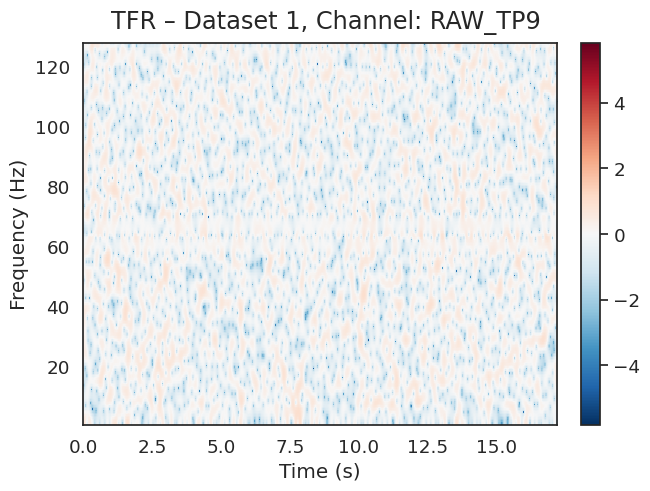

   📈 Plotting: Dataset 1, Channel: RAW_AF7
Applying baseline correction (mode: logratio)


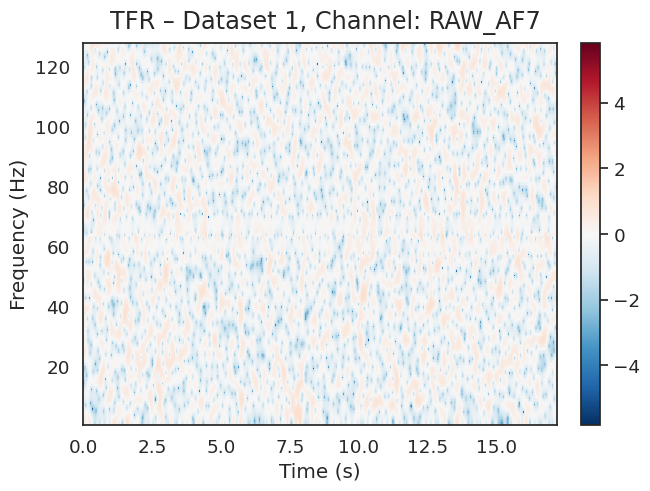

   📈 Plotting: Dataset 1, Channel: RAW_AF8
Applying baseline correction (mode: logratio)


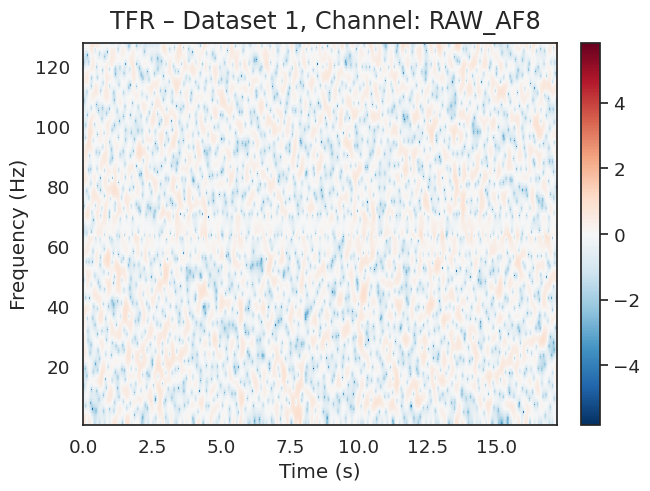

   📈 Plotting: Dataset 1, Channel: RAW_TP10
Applying baseline correction (mode: logratio)


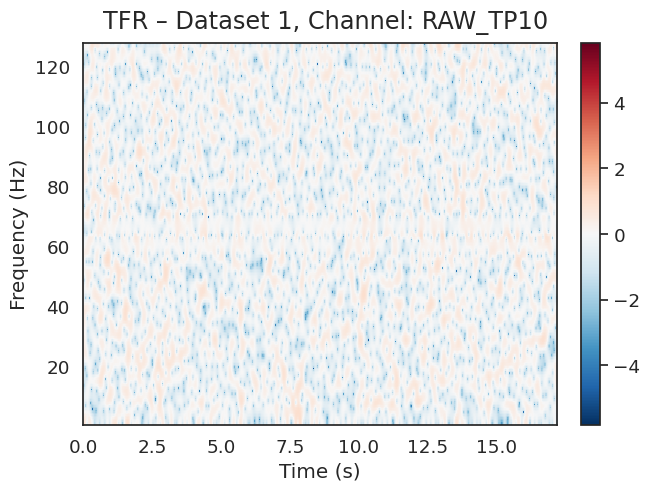


🔍 Processing TFR for Dataset 2...
→ Duration: 30.92 sec
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 7916 original time points ...
0 bad epochs dropped
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
   📊 Saving Data: Dataset 2, Channel: RAW_TP9
   📊 Saving Data: Dataset 2, Channel: RAW_AF7
   📊 Saving Data: Dataset 2, Channel: RAW_AF8
   📊 Saving Data: Dataset 2, Channel: RAW_TP10
   📈 Plotting: Dataset 2, Channel: RAW_TP9
Applying baseline correction (mode: logratio)


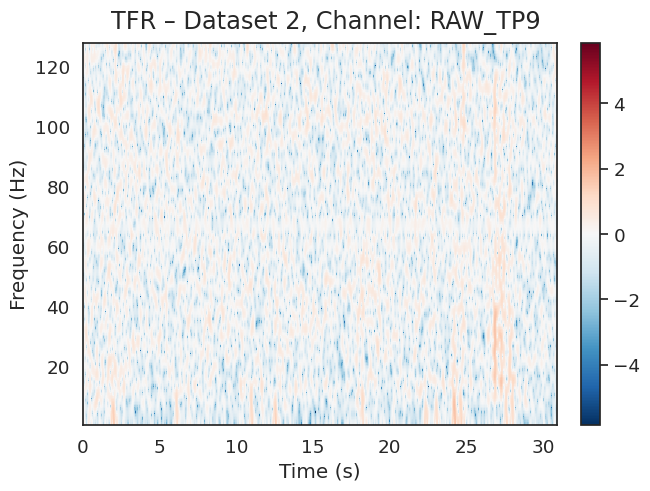

   📈 Plotting: Dataset 2, Channel: RAW_AF7
Applying baseline correction (mode: logratio)


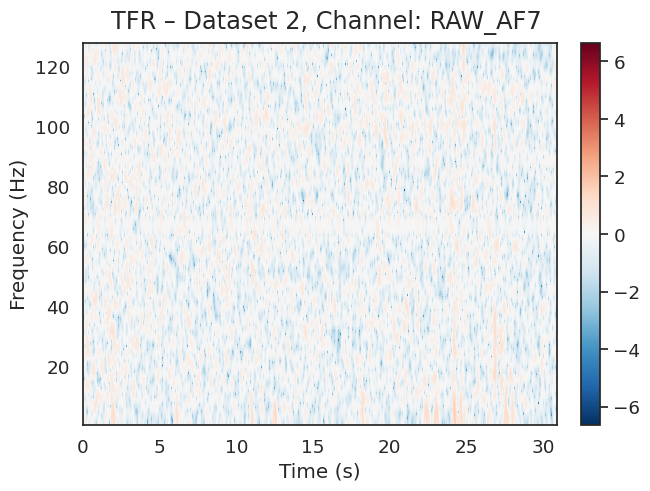

   📈 Plotting: Dataset 2, Channel: RAW_AF8
Applying baseline correction (mode: logratio)


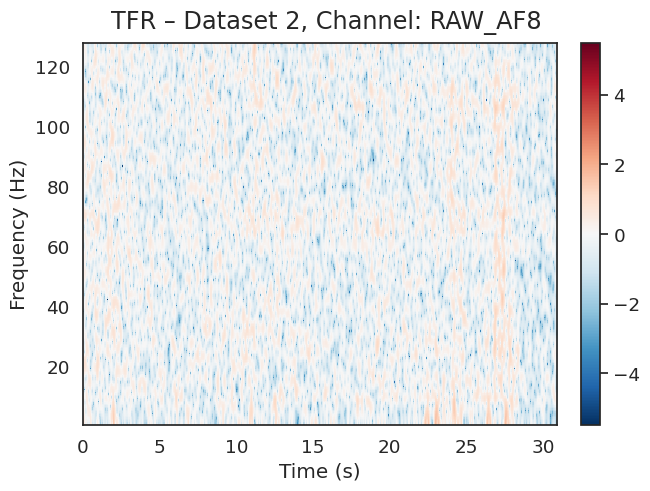

   📈 Plotting: Dataset 2, Channel: RAW_TP10
Applying baseline correction (mode: logratio)


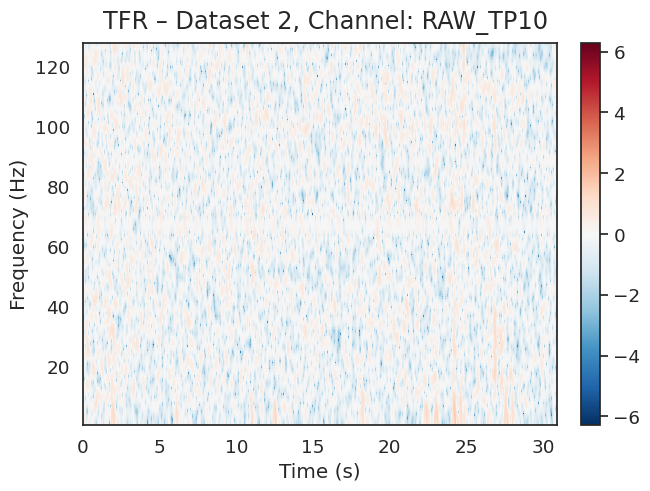


🔍 Processing TFR for Dataset 3...
→ Duration: 28.32 sec
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 7252 original time points ...
0 bad epochs dropped
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
   📊 Saving Data: Dataset 3, Channel: RAW_TP9
   📊 Saving Data: Dataset 3, Channel: RAW_AF7
   📊 Saving Data: Dataset 3, Channel: RAW_AF8
   📊 Saving Data: Dataset 3, Channel: RAW_TP10
   📈 Plotting: Dataset 3, Channel: RAW_TP9
Applying baseline correction (mode: logratio)


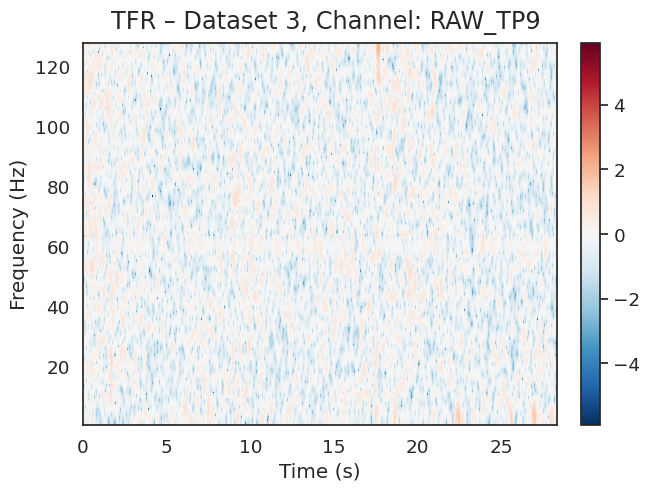

   📈 Plotting: Dataset 3, Channel: RAW_AF7
Applying baseline correction (mode: logratio)


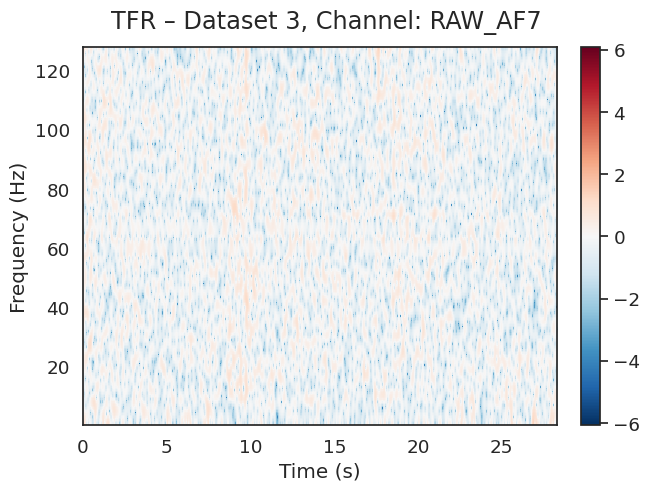

   📈 Plotting: Dataset 3, Channel: RAW_AF8
Applying baseline correction (mode: logratio)


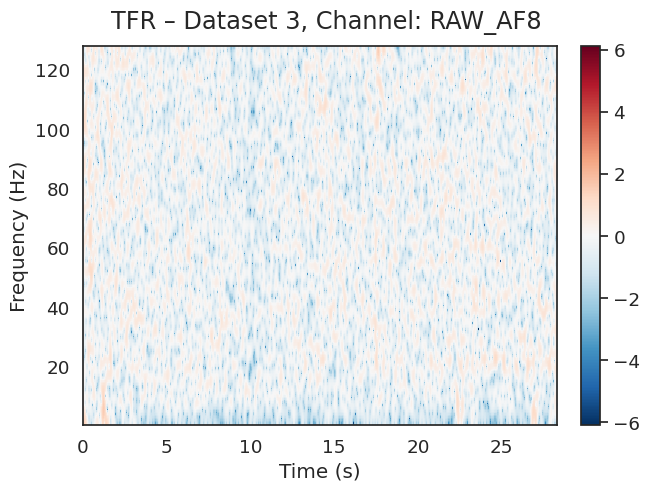

   📈 Plotting: Dataset 3, Channel: RAW_TP10
Applying baseline correction (mode: logratio)


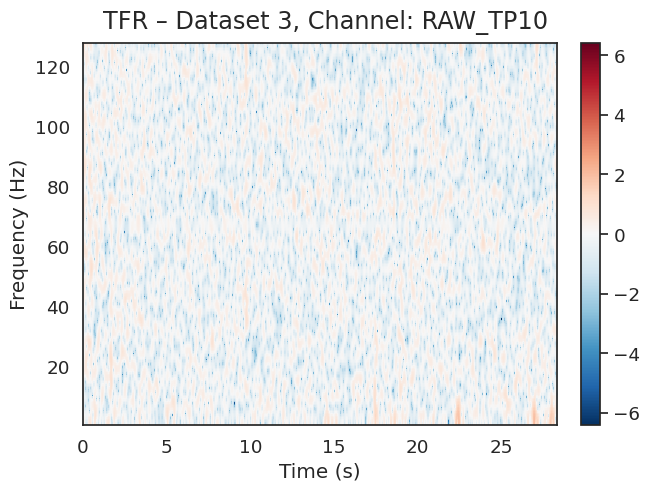


🔍 Processing TFR for Dataset 4...
→ Duration: 32.22 sec
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 8250 original time points ...
0 bad epochs dropped
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
   📊 Saving Data: Dataset 4, Channel: RAW_TP9
   📊 Saving Data: Dataset 4, Channel: RAW_AF7
   📊 Saving Data: Dataset 4, Channel: RAW_AF8
   📊 Saving Data: Dataset 4, Channel: RAW_TP10
   📈 Plotting: Dataset 4, Channel: RAW_TP9
Applying baseline correction (mode: logratio)


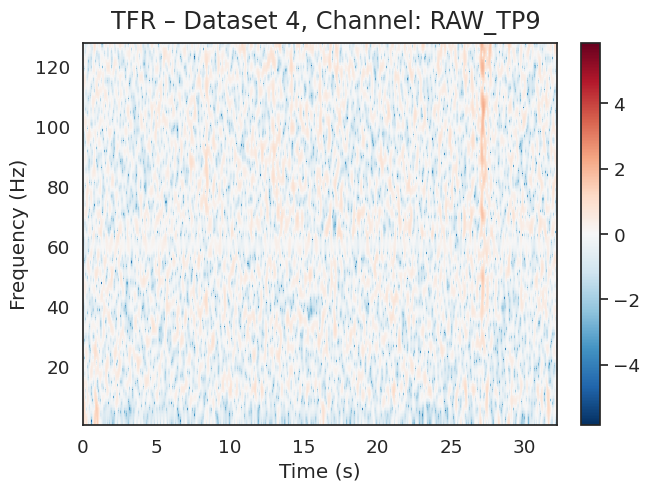

   📈 Plotting: Dataset 4, Channel: RAW_AF7
Applying baseline correction (mode: logratio)


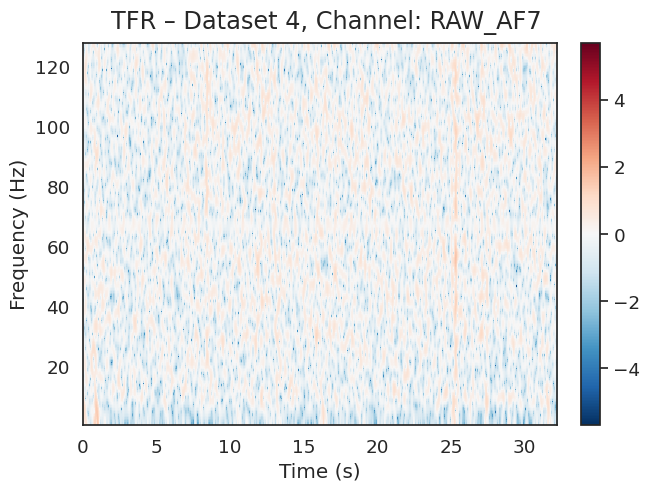

   📈 Plotting: Dataset 4, Channel: RAW_AF8
Applying baseline correction (mode: logratio)


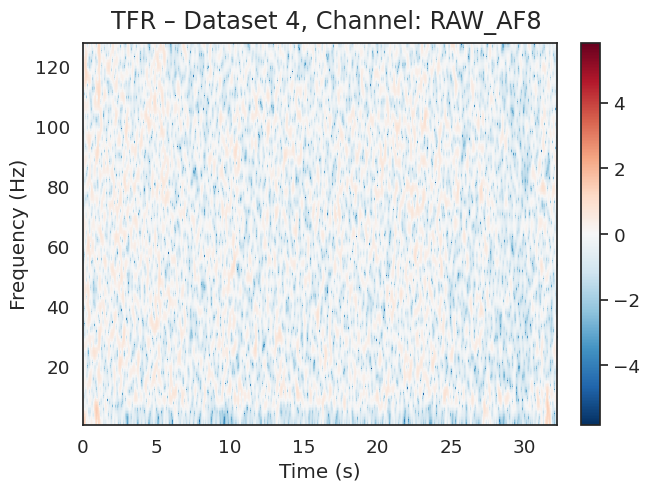

   📈 Plotting: Dataset 4, Channel: RAW_TP10
Applying baseline correction (mode: logratio)


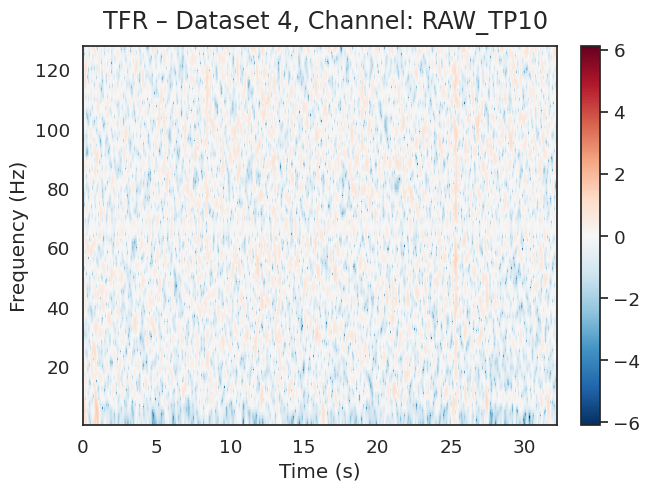


✅ All TFR peak plots and data saved — you can now download Morlet_TFR_Data folder!


In [12]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mne.time_frequency import tfr_morlet

# -------------------------------
# Frequency setup
# -------------------------------
sfreq = 256  # or extract from raw_cleaned.info['sfreq'] if needed
freqs = np.arange(0.5, sfreq / 2, 0.5)
n_cycles = freqs / 2.0

# Create output folder to save CSV files
output_folder = "Morlet_TFR_Data"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# TFR over full signal for each cleaned dataset
# -------------------------------
for i, raw_cleaned in enumerate(processed_datasets, start=1):
    print(f"\n🔍 Processing TFR for Dataset {i}...")

    # 1. Create a single event for full-length epoch
    duration = raw_cleaned.times[-1]
    print(f"→ Duration: {duration:.2f} sec")

    events = np.array([[0, 0, 1]])
    event_id = dict(full=1)

    epochs = mne.Epochs(
        raw_cleaned,
        events,
        event_id=event_id,
        tmin=0,
        tmax=duration,
        baseline=None,
        preload=True
    )

    # 2. Time–frequency analysis
    power = tfr_morlet(
        epochs,
        freqs=freqs,
        n_cycles=n_cycles,
        use_fft=True,
        return_itc=False,
        decim=3,
        n_jobs=1
    )

    # 3. Save TFR power data for each channel
    for ch_idx, ch_name in enumerate(power.ch_names):
        print(f"   📊 Saving Data: Dataset {i}, Channel: {ch_name}")

        # Extract power matrix (freqs × times)
        power_data = power.data[ch_idx, :, :]

        # Create DataFrame (rows: Frequencies, columns: Time points)
        df = pd.DataFrame(
            power_data,
            index=[f"{f:.1f} Hz" for f in power.freqs],   # Label rows by frequency
            columns=[f"{t:.2f} s" for t in power.times]   # Label columns by time
        )

        # Save as CSV
        filename = f"{output_folder}/TFR_Dataset{i}_{ch_name}.csv"
        df.to_csv(filename)

    # 4. (Optional) Plot TFR for visualization
    for ch_name in power.ch_names:
        print(f"   📈 Plotting: Dataset {i}, Channel: {ch_name}")
        fig = power.plot(
            picks=[ch_name],
            baseline=(0, 10),
            mode='logratio',
            combine=None,
            title=f"TFR – Dataset {i}, Channel: {ch_name}",
            show=False
        )
        fig = fig if isinstance(fig, list) else [fig]
        for f in fig:
            plt.figure(f.number)
            plt.show()

print("\n✅ All TFR peak plots and data saved — you can now download Morlet_TFR_Data folder!")


In [13]:
import shutil
from google.colab import files

# Zip the folder
shutil.make_archive('Morlet_TFR_Data', 'zip', 'Morlet_TFR_Data')

# Download the zipped file
files.download('Morlet_TFR_Data.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>